## PROJECT : INTEGRATED RETAIL ANALYTICS FOR STORE OPTIMIZATION AND DEMAND FORECASTING

### Project Type - Advanced ML - EDA/Regression/Time_Series_Analysis/Clustering/Market_Basket_Analysis

### Contribution - Individual - Aiman Sahay

### **PROJECT SUMMARY**

Write the summary here within 500-600 words.

### **GITHUB LINK**

Provide your GitHub Link here.

### **PROBLEM STATEMENT**

Write Problem Statement Here.

# ***Let's Begin !***

### ***1. Know Your Data***

### Import Libraries

In [235]:
# Install libraries

# !pip install prophet
# !pip install xgboost
!pip install apyori

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for apyori: filename=apyori-1.1.2-py3-none-any.whl size=5975 sha256=6764e77a552453af54df14339fc4eccb68b17e18b1348d0716d0ec9225301bff
  Stored in directory: c:\users\aimee\appdata\local\pip\cache\wheels\4d\9f\d0\7ba4ae3f5de2f76ea362170ea0f157e6cc1d1b9aea188175f2
Successfully built apyori


  DEPRECATION: Building 'apyori' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'apyori'. Discussion can be found at https://github.com/pypa/pip/issues/6334


In [236]:
import warnings
warnings.filterwarnings('ignore')

import math

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer # For basic missing value imputation
from sklearn.compose import ColumnTransformer # For applying different transformers to different columns
from sklearn.pipeline import Pipeline # For chaining multiple processing steps

# Feature Selection
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA

# Machine Learning - Model Selection and Evaluation
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV # For splitting data, time-series validation, and hyperparameter tuning
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score # For regression evaluation metrics
from sklearn.metrics import silhouette_score, davies_bouldin_score # For clustering evaluation metrics
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix # For classification/anomaly detection evaluation

# Machine Learning - Anomaly Detection
from sklearn.ensemble import IsolationForest # For detecting anomalies in sales data
from sklearn.svm import OneClassSVM # Another option for anomaly detection

# Machine Learning - Clustering (for Customer Segmentation)
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN # For various clustering algorithms
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
from apyori import apriori

# Machine Learning - Demand Forecasting Models
from statsmodels.tsa.seasonal import STL # For time-series decomposition (trend, seasonality, residual)
from statsmodels.tsa.arima.model import ARIMA # For ARIMA/SARIMA models
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet import Prophet # Facebook's forecasting tool, excellent for business time series
import xgboost as xgb # XGBoost for powerful regression (forecasting) and feature importance
from xgboost import XGBRegressor


### Load Dataset

In [3]:
features_df = pd.read_csv("C:/Users/aimee/OneDrive/Data Science MSc/AlmaBetter MSc Data Science/Capstone Projects/Spl_Mod_3_Adv.ML/Datasets/Features data set.csv")
sales_df = pd.read_csv("C:/Users/aimee/OneDrive/Data Science MSc/AlmaBetter MSc Data Science/Capstone Projects/Spl_Mod_3_Adv.ML/Datasets/sales data-set.csv")
stores_df = pd.read_csv("C:/Users/aimee/OneDrive/Data Science MSc/AlmaBetter MSc Data Science/Capstone Projects/Spl_Mod_3_Adv.ML/Datasets/stores data-set.csv")

### Dataset First View

In [4]:
features_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,12/02/2010,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,19/02/2010,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,26/02/2010,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,05/03/2010,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [5]:
sales_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,False
1,1,1,12/02/2010,46039.49,True
2,1,1,19/02/2010,41595.55,False
3,1,1,26/02/2010,19403.54,False
4,1,1,05/03/2010,21827.90,False


In [6]:
stores_df.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


### Dataset Rows & Columns count

In [7]:
print(f"Features Dataset Shape: {features_df.shape}\n")
print(f"Sales Dataset Shape: {sales_df.shape}\n")
print(f"Stores Dataset Shape: {stores_df.shape}\n")

Features Dataset Shape: (8190, 12)

Sales Dataset Shape: (421570, 5)

Stores Dataset Shape: (45, 3)



### Dataset Information

In [8]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


In [9]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [10]:
stores_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


### Dataset Description

In [11]:
features_df.describe()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,8190.000000,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000
mean,23.000000,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821
std,12.987966,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259
min,1.000000,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000
25%,12.000000,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000
50%,23.000000,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000
75%,34.000000,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000
max,45.000000,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000


In [12]:
sales_df.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [13]:
stores_df.describe()

,Store,Size
count,45.000000,45.000000
mean,23.000000,130287.600000
std,13.133926,63825.271991
min,1.000000,34875.000000
25%,12.000000,70713.000000
50%,23.000000,126512.000000
75%,34.000000,202307.000000
max,45.000000,219622.000000


### Duplicate Values

In [14]:
# Features Dataset Duplicate Value Count
print(f" Duplicate values in features Dataset: {features_df.duplicated().sum()}")

# Sales Dataset Duplicate Value Count
print(f" Duplicate values in sales Dataset: {sales_df.duplicated().sum()}")

# Stores Dataset Duplicate Value Count
print(f" Duplicate values in stores Dataset: {stores_df.duplicated().sum()}")

 Duplicate values in features Dataset: 0
 Duplicate values in sales Dataset: 0
 Duplicate values in stores Dataset: 0


### Missing Values

In [15]:
print("Features Dataset - Missing Values count\n")

features_df.isnull().sum()

Features Dataset - Missing Values count



Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

In [16]:
print("Sales Dataset - Missing Values count\n")

sales_df.isnull().sum()

Sales Dataset - Missing Values count



Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [17]:
print("Stores Dataset - Missing Values count\n")

stores_df.isnull().sum()

Stores Dataset - Missing Values count



Store    0
Type     0
Size     0
dtype: int64

##### Visualize Missing Values

In [18]:
# Function to plot missing vs. valid values
def plot_missing_valid(df, title, ax):
    total_counts = len(df)
    missing_counts = df.isnull().sum()
    valid_counts = total_counts - missing_counts

    ax.bar(missing_counts.index, valid_counts, label='Valid', color='lightblue')
    ax.bar(missing_counts.index, missing_counts, bottom=valid_counts, label='Missing', color='pink')

    ax.set_title(title)
    ax.set_xlabel('Columns')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y')
    ax.legend()

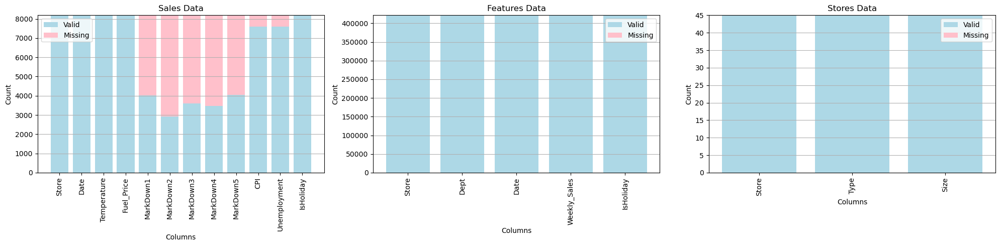

In [19]:
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Plot for each dataset
plot_missing_valid(features_df, 'Sales Data', axes[0])
plot_missing_valid(sales_df, 'Features Data', axes[1])
plot_missing_valid(stores_df, 'Stores Data', axes[2])

plt.tight_layout()
plt.show()

The visualization displays missing and valid data across three datasets. In the Sales Data, significant missing values are present in the MarkDown1 to MarkDown5 columns, which may impact analysis and require imputation strategies. In addition, there's also some missing data in CPI and Unemployment external factors. In contrast, both the Features Data and Stores Data are complete and have no missing values.

### Unique Values for each variable.

In [20]:
print("Features Dataset - Unique Value Count\n")

features_df.nunique()

Features Dataset - Unique Value Count



Store             45
Date             182
Temperature     4178
Fuel_Price      1011
MarkDown1       4023
MarkDown2       2715
MarkDown3       2885
MarkDown4       3405
MarkDown5       4045
CPI             2505
Unemployment     404
IsHoliday          2
dtype: int64

In [21]:
print("Sales Dataset - Unique Value Count\n")

sales_df.nunique()

Sales Dataset - Unique Value Count



Store               45
Dept                81
Date               143
Weekly_Sales    359464
IsHoliday            2
dtype: int64

In [22]:
print("Stores Dataset - Unique Value Count\n")

stores_df.nunique()

Stores Dataset - Unique Value Count



Store    45
Type      3
Size     40
dtype: int64

---
## ***2. Understanding Variables***

The project integrates three datasets:

* **Sales dataset**: Contains Weekly_Sales figures for Store and Date, along with IsHoliday flag. This is the primary source for sales trends and forecasting.
* **Features dataset**: Provides contextual information like Temperature, Fuel_Price, CPI, Unemployment, and MarkDown1 to MarkDown5. These capture environmental and promotional influences.
* **Stores dataset**: Contains static store attributes like Type (e.g., A, B, C) and Size, crucial for understanding store characteristics and segmentation.

#### Feature-wise Explanations and Relevance

Upon merging, the comprehensive feature set will be utilized as follows:

* **Store:** Unique identifier for each retail outlet, enabling store-specific analysis and segmentation.
* **Dept:** Unique identifier for each department within a store.
* **Date:** Timestamp for each record, fundamental for time-series analysis, trend identification, and deriving features like Year, Month, WeekOfYear, DayOfWeek, etc.
* **Weekly_Sales:** The primary target variable for demand forecasting and key metric for anomaly detection.
* **IsHoliday:** Binary flag indicating holiday weeks, which significantly impact sales and require special consideration in models.
* **Temperature:** External factor influencing consumer behavior and sales, especially for seasonal products.
* **Fuel_Price:** Economic indicator affecting consumer spending and supply chain costs.
* **CPI (Consumer Price Index):** Measure of inflation and purchasing power, reflecting broader economic conditions.
* **Unemployment:** Economic indicator reflecting consumer confidence and spending.
* **MarkDown1 to MarkDown5:** Promotional markdown values, critical for understanding pricing strategy impact. Handling missing values in these is a key challenge.
* **Type (of Store):** Categorical classification of stores, vital for segmentation and understanding varying operational models.
* **Size (of Store):** Physical area of the store, correlating with inventory capacity and sales potential.
  
These features, through careful cleaning, engineering, and analysis, will drive accurate forecasts, actionable optimization strategies, and a deep understanding of retail performance.

#### Dataset Summary after Initial Inspection

1. **features_df** (Shape: 8190 × 12)

* Store: ID, for merging with other tables.
* Date: **Timestamp → needs conversion to datetime**.
* Economic & Environmental features: Temperature, Fuel_Price, CPI, Unemployment.
* Promotions: **MarkDown1–5 → lots of missing values → needs to be handled**.
* IsHoliday: Boolean flag.

2. **sales_df** (Shape: 421570 × 5)

* Store: ID.
* Dept: Department ID (granularity: Store–Dept–Date).
* Date: **Timestamp → needs conversion to datetime**.
* **Weekly_Sales: Target variable** (what we want to forecast).
* IsHoliday: Duplicate flag (should align with features_df).

3. **stores_df** (Shape: 45 × 3)

* Store: ID.
* Type: Categorical (A/B/C, etc.).
* Size: Store area (important for capacity and sales potential).

#### Business & Analytical Notes 

* Granularity matters → sales_df is at Store–Dept–Date level, while features_df is at Store–Date level. We’ll need to join carefully (probably outer join on Store+Date).
* Holidays → Very important for demand forecasting. May also need to engineer “days before/after holiday” flags.
* MarkDowns → Heavy missingness. Need an imputation strategy (zero vs. forward fill vs. modeling missingness).
* Economic Indicators (CPI, Unemployment, Fuel_Price) → Useful for long-term trend detection. May require lag features.
* Store metadata (Type, Size) → Good for segmentation, stratified models, and adding context.

In [23]:
sales_df[["Store", "Dept"]].value_counts()

Store  Dept
45     97      143
1      1       143
45     74      143
       72      143
       71      143
              ... 
18     39        1
3      83        1
       78        1
4      39        1
34     78        1
Name: count, Length: 3331, dtype: int64

---
## 3. ***Data Wrangling***

### Merge Datasets

**Merge Strategy**:

1. **First Merge**: Combine `sales` and `stores` datasets using the common column `Store` to enrich sales data with store characteristics.

2. **Second Merge**: Merge the result with the `features` dataset using both `Store` and `Date` columns, to align sales records with the corresponding temporal features and environmental conditions.

In [24]:
# Step 1: Merge sales with stores on 'Store'
sales_stores_df = pd.merge(sales_df, stores_df, on='Store', how='left')

# Step 2: Merge the result with features on 'Store' and 'Date'
df = pd.merge(sales_stores_df, features_df, on=['Store', 'Date'], how='left')

# Show the shape and first few rows of the final merged dataset
print("Final Merged Dataset Shape:", df.shape, "\n")
df.head()

Final Merged Dataset Shape: (421570, 17) 



,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y
0,1,1,05/02/2010,24924.50,False,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,1,12/02/2010,46039.49,True,A,151315,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,1,19/02/2010,41595.55,False,A,151315,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,1,26/02/2010,19403.54,False,A,151315,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,1,05/03/2010,21827.90,False,A,151315,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


The `IsHoliday` column appears twice after merging since its present in both, the 'sales_df' as well as 'features_df'. Let's check if both the columns are equivalent or not. If yes, one of them will be dropped and named as `IsHoliday`.

In [25]:
# Keep just one IsHoliday column
if df['IsHoliday_x'].equals(df['IsHoliday_y']):
    df['IsHoliday'] = df['IsHoliday_x']
    df.drop(columns=['IsHoliday_x', 'IsHoliday_y'], inplace=True)
else:
    print("Warning: 'IsHoliday_x' and 'IsHoliday_y' are not identical.")

In [26]:
# Check for Duplicates in the merged dataset
print(df.duplicated().sum())

0


In [27]:
df.head()

,Store,Dept,Date,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,1,05/02/2010,24924.50,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,1,12/02/2010,46039.49,A,151315,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,1,19/02/2010,41595.55,A,151315,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,1,26/02/2010,19403.54,A,151315,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,1,05/03/2010,21827.90,A,151315,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [28]:
df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'Type', 'Size', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'IsHoliday'],
      dtype='object')

In [29]:
df.shape

(421570, 16)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   Type          421570 non-null  object 
 5   Size          421570 non-null  int64  
 6   Temperature   421570 non-null  float64
 7   Fuel_Price    421570 non-null  float64
 8   MarkDown1     150681 non-null  float64
 9   MarkDown2     111248 non-null  float64
 10  MarkDown3     137091 non-null  float64
 11  MarkDown4     134967 non-null  float64
 12  MarkDown5     151432 non-null  float64
 13  CPI           421570 non-null  float64
 14  Unemployment  421570 non-null  float64
 15  IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(10), int64(3), object(2)
memory usage: 48.6+ MB


### Data Type Conversion

In [31]:
# Check the data types of the features in the merged dataset
df.dtypes

Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
Type             object
Size              int64
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
IsHoliday          bool
dtype: object

##### Convert `Date` to datetime format

In [32]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)

##### Convert `Type`, `Store`, `Dept` columns to category format

In [33]:
df['Type'] = df['Type'].astype('category')
df['Store'] = df['Store'].astype('category')
df['Dept'] = df['Dept'].astype('category')

In [34]:
df.dtypes

Store                 category
Dept                  category
Date            datetime64[ns]
Weekly_Sales           float64
Type                  category
Size                     int64
Temperature            float64
Fuel_Price             float64
MarkDown1              float64
MarkDown2              float64
MarkDown3              float64
MarkDown4              float64
MarkDown5              float64
CPI                    float64
Unemployment           float64
IsHoliday                 bool
dtype: object

### Handling Missing Values

##### Calculate missing value %

In [35]:
def missing_val_df(df):
    # Calculate the total number of missing values in each column
    missing_count = df.isnull().sum()
    
    # Calculate the percentage of missing values in each column
    missing_percent = (missing_count / len(df)) * 100
    
    # Create a DataFrame to display missing counts and percentages side by side
    missing_df = pd.DataFrame({
        'Missing Count': missing_count,
        'Missing Percentage': missing_percent.round(2)
    })
    
    # Return the missing_values df
    return missing_df

In [36]:
missing_val_df(df)

,Missing Count,Missing Percentage
Store,0,0.00
Dept,0,0.00
Date,0,0.00
Weekly_Sales,0,0.00
Type,0,0.00
Size,0,0.00
Temperature,0,0.00
Fuel_Price,0,0.00
MarkDown1,270889,64.26
MarkDown2,310322,73.61


The **MarkDown** columns contain ~67% missing values. Since these columns represent discounts or price reductions, it is reasonable to assume that missing values indicate no markdown applied. Therefore, we will **fill all NaN values in these columns with 0** to reflect this assumption.

In [37]:
md_cols = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']  # markdown columns
df[md_cols] = df[md_cols].fillna(0)  # fill NaNs with 0 in these columns

In [38]:
missing_val_df(df)

,Missing Count,Missing Percentage
Store,0,0.0
Dept,0,0.0
Date,0,0.0
Weekly_Sales,0,0.0
Type,0,0.0
Size,0,0.0
Temperature,0,0.0
Fuel_Price,0,0.0
MarkDown1,0,0.0
MarkDown2,0,0.0


All missing values have been handled.

---

## 4. Outlier Handling

Numerical Columns

In [39]:
df.select_dtypes(include=['int64', 'float64']).columns.tolist()

['Weekly_Sales',
 'Size',
 'Temperature',
 'Fuel_Price',
 'MarkDown1',
 'MarkDown2',
 'MarkDown3',
 'MarkDown4',
 'MarkDown5',
 'CPI',
 'Unemployment']

In [40]:
# Manually select all numerical columns

num_cols = [
    'Size', 'Weekly_Sales', 'Temperature', 'Fuel_Price','MarkDown1', 'MarkDown2', 'MarkDown3','MarkDown4', 'MarkDown5', 'CPI', 'Unemployment'
    ]

#### Outlier Visualization BEFORE Handling

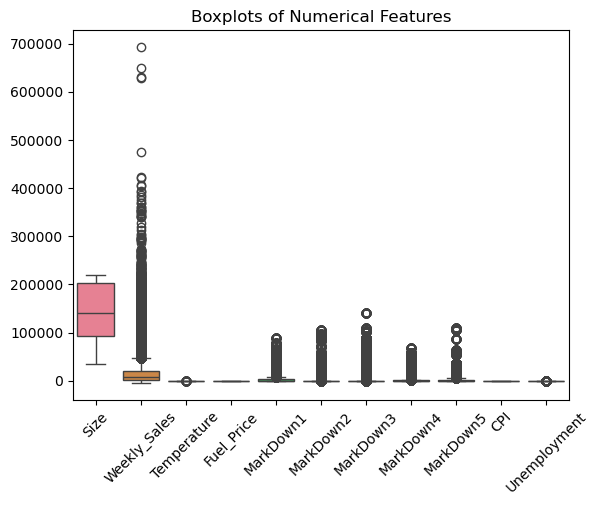

In [41]:
# Boxplot for selected numeric columns
sns.boxplot(data=df[num_cols])
plt.xticks(rotation=45)
plt.title("Boxplots of Numerical Features")
plt.show()

- **Weekly_Sales** and **MarkDown1–5** show many outliers, indicating skewed distributions with extreme values.  
- **Size**, **Temperature**, **Fuel_Price**, **CPI**, and **Unemployment** have relatively stable distributions with fewer outliers.  

These insights suggest the need for outlier handling or scaling before modeling.

#### Outlier Handling

In [42]:
# This function caps outliers in specified numerical columns of a DataFrame based on given lower and upper percentile thresholds.

def cap_outliers_multiple_cols(df, num_cols, lower_pct=0.01, upper_pct=0.99):
    for col in num_cols:
        if df[col].dtype in ['float64', 'int64']:
            # Calculate the lower and upper bounds using quantiles
            lower_bound = df[col].quantile(lower_pct)
            upper_bound = df[col].quantile(upper_pct)
            # Cap the values outside the bounds to the calculated limits
            df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)
    return df

# Usage:
df = cap_outliers_multiple_cols(df, num_cols)

#### Outlier Visualization AFTER Handling

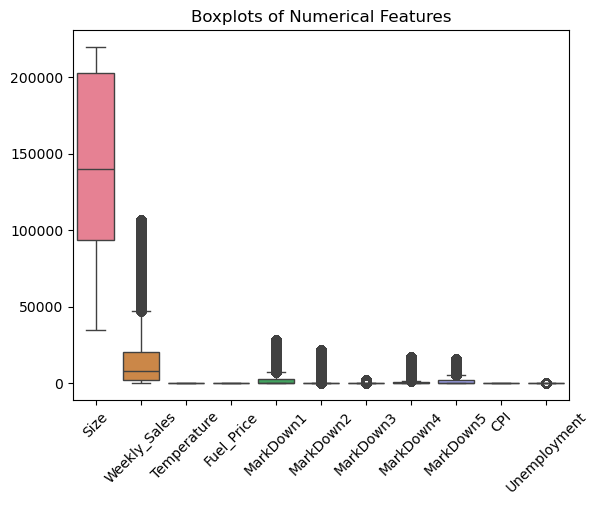

In [43]:
# Boxplot to confirm the Outlier capping
sns.boxplot(data=df[num_cols])
plt.xticks(rotation=45)
plt.title("Boxplots of Numerical Features")
plt.show()

After applying outlier capping using the 1st and 99th percentile thresholds, we observe a significant improvement in the distribution of numerical features:

- Extreme outliers have been **limited** without removing any data points, preserving the dataset size.
- The **boxplots are more compact**, and the whiskers now reflect a more accurate spread of the core data.
- Features like **Weekly_Sales**, **Markdown 1-5** show a **reduction in extreme skewness**, helping to stabilize statistical analysis and improve model performance.

#### Filtering Sales Data by Valid Stores

In [44]:
valid_stores = stores_df['Store'].unique()
sales_df[sales_df['Store'].isin(valid_stores)]

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,False
1,1,1,12/02/2010,46039.49,True
2,1,1,19/02/2010,41595.55,False
3,1,1,26/02/2010,19403.54,False
4,1,1,05/03/2010,21827.90,False
...,...,...,...,...,...
421565,45,98,28/09/2012,508.37,False
421566,45,98,05/10/2012,628.10,False
421567,45,98,12/10/2012,1061.02,False
421568,45,98,19/10/2012,760.01,False


In [46]:
sales_df.shape

(421570, 5)

All sales correspond to stores mentioned in the stores_df.

---

## 4. Anomaly Detection

In [47]:
# Convert the 'Date' column to the day name (e.g., Monday, Tuesday) and count occurrences
df['Date'].dt.day_name().value_counts()

Date
Friday    421570
Name: count, dtype: int64

The data shows that all sales, totaling 421,570, occur on Fridays. This suggests that Friday is considered as the weekly pivot for considering each week's sales.

In [48]:
# Extract unique combinations of 'Store' and 'Dept' from the dataset
unique_combinations = df[['Store', 'Dept']].drop_duplicates()
unique_combinations

,Store,Dept
0,1,1
143,1,2
286,1,3
429,1,4
572,1,5
...,...,...
421013,45,94
421147,45,95
421290,45,96
421292,45,97


### Time-Based Anomaly Detection

#### STL Decomposition

STL (Seasonal-Trend Decomposition using Loess) is a powerful technique in time series analysis that breaks down a series into three key components:

1. **Seasonal**: This component captures recurring patterns or cycles within a fixed period, such as weekly or monthly trends.

2. **Trend**: The trend component identifies the long-term movement in the data by smoothing out short-term fluctuations and highlighting the underlying trajectory.

3. **Residual**: After removing the seasonal and trend effects, the residual component represents irregular variations or noise.

STL is known for its flexibility and robustness, effectively adapting to shifts in data patterns and being resistant to outliers. These features make it ideal for applications like anomaly detection and complex seasonal pattern analysis.

In [49]:
from tqdm import tqdm
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL

stl_results = []

# Check how many rows per group
group_sizes = df.groupby(['Store', 'Dept']).size()

for (store, dept), group in tqdm(df.groupby(['Store', 'Dept'])):
    group = group.sort_values('Date')
    group.set_index('Date', inplace=True)

    # Preserve original index and fillna before interpolation
    original_index = group.index

    # Check: do we have at least 13 weeks of data?
    if len(group) < 13:
        group['anomaly_stl'] = False
    else:
        # Interpolate Weekly_Sales if needed
        group['Weekly_Sales'] = group['Weekly_Sales'].interpolate()

        try:
            # STL decomposition
            stl = STL(group['Weekly_Sales'], seasonal=13, robust=True)
            result = stl.fit()
            residual_z = (result.resid - result.resid.mean()) / result.resid.std()
            group['anomaly_stl'] = np.abs(residual_z) > 3
        except Exception:
            group['anomaly_stl'] = False

    # Reset index to get Date back as a column
    group = group.reindex(original_index)  # Ensure all original rows are included
    group.reset_index(inplace=True)
    group['Store'] = store
    group['Dept'] = dept

    # Append processed group
    stl_results.append(group)

# Concatenate all results ensuring all groups are included
df = pd.concat(stl_results, ignore_index=True)

# Verify the result
print("STL anomalies detected:", df['anomaly_stl'].sum())

100%|██████████| 3331/3331 [04:14<00:00, 13.11it/s]


STL anomalies detected: 11357


The analysis identified **11,357 anomalies** using STL decomposition. These anomalies are data points with residuals significantly deviating from the norm, indicating irregular patterns or outliers in the time series data.

#### SPC (Statistical Process Control)

Statistical Process Control (SPC) is a method used to monitor and control processes through statistical techniques. It helps ensure that a process operates efficiently and produces products within desired quality standards.

**Key Features of SPC**:

- **Control Limits**: SPC uses control limits, typically set at ±3 standard deviations from the process mean, to detect anomalies.
- **Consistency Monitoring**: By analyzing variations, SPC distinguishes between common cause variation (natural) and special cause variation (signals of issues).
- **Proactive Management**: Identifying trends or shifts enables timely interventions to maintain process stability and quality.

In the context of time series, SPC helps identify deviations in sales patterns, indicating potential issues that require further investigation.

In [50]:
spc_results = []

for (store, dept), group in tqdm(df.groupby(['Store', 'Dept'])):
    # Sort and maintain the original index
    group = group.sort_values('Date').set_index('Date')

    if group.shape[0] < 10:
        group['anomaly_spc'] = False
    else:
        # Interpolate and calculate SPC limits
        group['Weekly_Sales'] = group['Weekly_Sales'].interpolate()
        mean = group['Weekly_Sales'].mean()
        std = group['Weekly_Sales'].std()
        upper = mean + 3 * std
        lower = mean - 3 * std
        group['anomaly_spc'] = (group['Weekly_Sales'] > upper) | (group['Weekly_Sales'] < lower)

    # Reset index to bring Date back as a column
    group.reset_index(inplace=True)
    group['Store'] = store
    group['Dept'] = dept
    spc_results.append(group)

# Concatenate results
df = pd.concat(spc_results, ignore_index=True)

print("SPC anomalies detected:", df['anomaly_spc'].sum())

100%|██████████| 3331/3331 [00:09<00:00, 364.26it/s]


SPC anomalies detected: 5994


The SPC analysis identified **5,994 anomalies**. These anomalies signify sales data points that fall outside of the control limits, set as ±3 standard deviations from the mean.

#### Isolation Forest

Isolation Forest detects anomalies by isolating observations through random splits. **Outliers are quickly isolated with fewer splits**. It is efficient and suitable for large datasets with no assumptions about data distribution. In this analysis, it helps identify anomalies in sales data, enhancing data quality and insights.

In [51]:
iso_results = []

# Store the original row count for later verification
original_row_count = df.shape[0]

for (store, dept), group in tqdm(df.groupby(['Store', 'Dept'])):
    # Sort and set the index for the group
    group.sort_values('Date', inplace=True)
    group.set_index('Date', inplace=True)

    # Re-interpolate to fill gaps without `asfreq`
    group['Weekly_Sales'] = group['Weekly_Sales'].interpolate(method='linear', limit_direction='both')

    for feature in ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']:
        group[feature] = group[feature].interpolate(method='linear', limit_direction='both')
        group[feature] = group[feature].fillna(method='ffill').fillna(method='bfill')

    # Extract model features
    features = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
    model_input = group[features]

    if model_input.isna().any().any():
        model_input.fillna(model_input.mean(), inplace=True)

    # Fit model if there are enough rows
    if model_input.shape[0] >= 10:
        iso_model = IsolationForest(n_estimators=50, contamination=0.05, n_jobs=-1, random_state=42)
        preds = iso_model.fit_predict(model_input)
        anomaly_flags = pd.Series(False, index=group.index)
        anomaly_flags.loc[model_input.index] = preds == -1
        group['anomaly_iso'] = anomaly_flags
    else:
        group['anomaly_iso'] = False

    group.reset_index(inplace=True)
    group['Store'] = store
    group['Dept'] = dept
    iso_results.append(group)

# Combine all results back together
df = pd.concat(iso_results, ignore_index=True)

# Print summary
final_row_count = df.shape[0]
print(f"Original rows: {original_row_count}, Final rows: {final_row_count}")
print("Isolation Forest anomalies detected:", df['anomaly_iso'].sum())

100%|██████████| 3331/3331 [06:29<00:00,  8.55it/s]


Original rows: 421570, Final rows: 421570
Isolation Forest anomalies detected: 23507


Detected **23,507** anomalies by isolating observations through random feature splits, offering the most comprehensive anomaly detection.

In [52]:
# Merge Anomaly Results into One DataFrame
from functools import reduce

# Ensure only relevant columns and avoid duplication
stl_anomalies = df[['Store', 'Dept', 'Date', 'anomaly_stl']]
spc_anomalies = df[['Store', 'Dept', 'Date', 'anomaly_spc']]
iso_anomalies = df[['Store', 'Dept', 'Date', 'anomaly_iso']]

# Merge all results
combined_df = reduce(lambda left, right: pd.merge(left, right, on=['Store', 'Dept', 'Date'], how='outer'),
                     [stl_anomalies, spc_anomalies, iso_anomalies])

# Create consensus flag (2 or more methods agree)
combined_df['anomaly_consensus'] = combined_df[['anomaly_stl', 'anomaly_spc', 'anomaly_iso']].sum(axis=1) >= 2

# Print anomaly counts
print("\n--- Anomaly Summary ---")
print("STL anomalies:", combined_df['anomaly_stl'].sum())
print("SPC anomalies:", combined_df['anomaly_spc'].sum())
print("Isolation Forest anomalies:", combined_df['anomaly_iso'].sum())
print("Consensus anomalies (≥2 methods):", combined_df['anomaly_consensus'].sum())


--- Anomaly Summary ---
STL anomalies: 11357
SPC anomalies: 5994
Isolation Forest anomalies: 23507
Consensus anomalies (≥2 methods): 6079


This code **merges anomaly detection results from STL, SPC, and Isolation Forest** into a single DataFrame to identify consensus anomalies. It starts by extracting relevant columns ('Store', 'Dept', 'Date', and anomaly flags) from the main DataFrame. The `reduce` function combines these DataFrames using `pd.merge`, aligning anomalies by 'Store', 'Dept', and 'Date'. A consensus flag is computed by checking if two or more methods agree on an anomaly, using a sum of the anomaly flags. Finally, the code prints the total anomaly counts for each method and the consensus.

In [53]:
# Investigate Causes of Consensus Anomalies
# Merge anomaly flags with original feature data
df = pd.merge(combined_df[['Store', 'Dept', 'Date', 'anomaly_consensus']],
                      df,
                      on=['Store', 'Dept', 'Date'], how='right')

# Ensure anomaly_consensus is binary (1 for anomalies, 0 for non-anomalies)
df['anomaly_consensus'] = df['anomaly_consensus'].fillna(0).astype(int)

# Verify row count and anomaly count
print("Total rows in df:", len(df))
print("Number of anomalies:", df['anomaly_consensus'].sum())

Total rows in df: 421570
Number of anomalies: 6079


This code snippet merges consensus anomaly flags back into the original data with a right join, preserving all entries. It ensures 'anomaly_consensus' is a binary flag by filling missing values with zero and converting to integers. The result shows a total of 421,570 rows, with 6,079 identified as consensus anomalies.

In [54]:
# Print all column names after the Anomaly Detection
df.columns

Index(['Store', 'Dept', 'Date', 'anomaly_consensus', 'Weekly_Sales', 'Type',
       'Size', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday', 'anomaly_stl', 'anomaly_spc', 'anomaly_iso'],
      dtype='object')

In [55]:
# DataFrame shape after Anomaly Detection
df.shape

(421570, 20)

#### Evaluating Anomaly Detection Models Using Precision, Recall, and F1 Score

In [56]:
from sklearn.metrics import precision_score, recall_score, f1_score

models = ['anomaly_stl', 'anomaly_iso', 'anomaly_spc']

for model in models:
    y_pred = df[model]
    y_true = df['anomaly_consensus']

    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    print(f"\nEvaluation for {model}:")
    print(f"  Precision: {precision:.3f}")
    print(f"  Recall:    {recall:.3f}")
    print(f"  F1 Score:  {f1:.3f}")



Evaluation for anomaly_stl:
  Precision: 0.072
  Recall:    0.135
  F1 Score:  0.094

Evaluation for anomaly_iso:
  Precision: 0.257
  Recall:    0.993
  F1 Score:  0.408

Evaluation for anomaly_spc:
  Precision: 0.918
  Recall:    0.905
  F1 Score:  0.911


The **SPC method** outperforms the others with a precision of 0.918, recall of 0.905, and an F1 score of 0.911, indicating it effectively balances identifying anomalies accurately and retrieving most of the consensus anomalies.

#### Anomalies with respect to Holidays

In [58]:
# Filter anomalies
anomalies = df[df['anomaly_consensus'] == 1]

# Check how many anomalies coincide with holidays
holiday_anomalies = anomalies['IsHoliday'].sum()
print(f"Number of consensus anomalies during holidays: {holiday_anomalies}")

Number of consensus anomalies during holidays: 1044


#### Anomalies with respect to Economic indicators

In [60]:
# List of columns to check
columns_to_check = ['Weekly_Sales', 'CPI', 'Unemployment', 'Fuel_Price', 'Temperature']

# Dictionary of n_std values with approximate percentage capture (two tails)
n_std_dict = {
    'Weekly_Sales' : 2,
    'CPI': 1.3,
    'Unemployment': 2,   # ~5% of data expected outside ±2 std
    'Fuel_Price': 1.6,
    'Temperature':2
}

for col in columns_to_check:
    n_std = n_std_dict[col]
    col_mean = df[col].mean()
    col_std = df[col].std()
    threshold_low = col_mean - n_std * col_std
    threshold_high = col_mean + n_std * col_std

    col_anomalies = df[(df[col] < threshold_low) | (df[col] > threshold_high)]
    num_col_anomalies = col_anomalies.shape[0]
    percent_anomalies = (num_col_anomalies / len(df)) * 100

    print(f"Number of anomalies with extreme {col} (n_std={n_std}): {num_col_anomalies} "
          f"which is approximately {percent_anomalies:.2f}% of total data.\n")

Number of anomalies with extreme Weekly_Sales (n_std=2): 24549 which is approximately 5.82% of total data.

Number of anomalies with extreme CPI (n_std=1.3): 20101 which is approximately 4.77% of total data.

Number of anomalies with extreme Unemployment (n_std=2): 26848 which is approximately 6.37% of total data.

Number of anomalies with extreme Fuel_Price (n_std=1.6): 30583 which is approximately 7.25% of total data.

Number of anomalies with extreme Temperature (n_std=2): 11941 which is approximately 2.83% of total data.



**Anomaly Detection Insights (External Factors and Weekly Sales)**

The anomaly detection results shed light on different behavioral and economic aspects influencing retail performance across stores and departments.

**Holiday-Period Anomalies:**
A total of **1,045** anomalies were observed during holiday periods, reflecting sharp deviations in consumer behavior and sales volumes. These periods likely capture promotional spikes, stockouts, or operational adjustments that differ from typical weekly trends.

**Weekly Sales Anomalies (5.82%):**
With **24,549** anomalies, weekly sales show considerable variability, indicating weeks of unusually high or low sales. These could be attributed to seasonal demand shifts, promotional events, competitive factors, or data inconsistencies such as missing transactions or recording delays.

**CPI Anomalies (4.77%):**
The **20,101** CPI anomalies suggest fluctuations in inflation-related indicators, which may reflect price instability, regional cost differences, or data reporting variations. Such deviations can impact consumer purchasing power and pricing strategies.

**Unemployment Anomalies (6.37%):**
With **26,848** anomalies, unemployment shows the highest degree of deviation among the economic indicators, hinting at labor market volatility that could influence consumer spending and overall store performance.

**Fuel Price Anomalies (7.25%):**
The **30,583** anomalies in fuel prices highlight frequent or sharp changes in energy costs. Since fuel expenses affect logistics, transportation, and consumer travel behavior, these anomalies can have direct downstream effects on sales and store-level profitability.

**Temperature Data (2.83%):**
With **11,941** anomalies, temperature deviations suggest periods of unusual weather or data inconsistencies, potentially impacting seasonal demand patterns and store performance.

In [61]:
# Check row counts
print("Total rows in df:", len(df))
print("Rows in anomalies:", len(anomalies))
print("Number of anomalies in df:", df['anomaly_consensus'].sum())

Total rows in df: 421570
Rows in anomalies: 6079
Number of anomalies in df: 6079


---

## 5. Sales Trend Analysis (STL Trend)

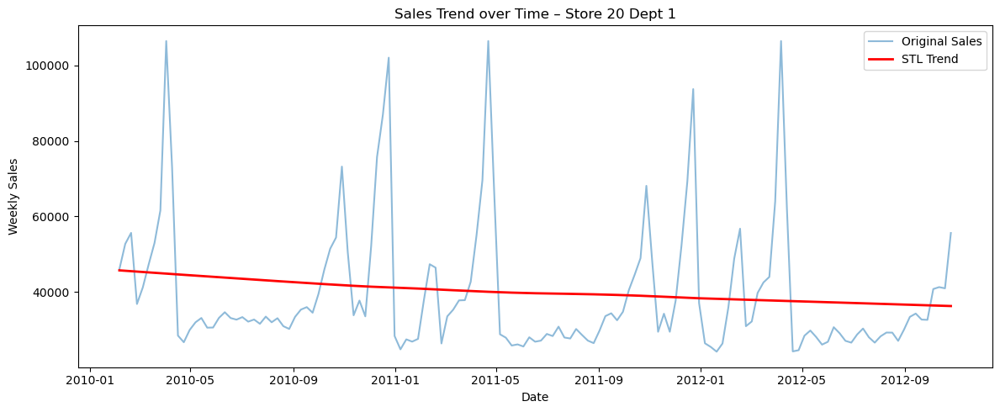

In [62]:
# Visualizing sales trend over time for Store 20 Dept 1
store, dept = 20, 1 
example = df[(df['Store'] == store) & (df['Dept'] == dept)].copy()
example = example.set_index('Date').sort_index().asfreq('W-FRI')
example['Weekly_Sales'] = example['Weekly_Sales'].interpolate()
stl = STL(example['Weekly_Sales'], seasonal=13)
result = stl.fit()
example['Trend'] = result.trend

plt.figure(figsize=(12,5))
plt.plot(example.index, example['Weekly_Sales'], label='Original Sales', alpha=0.5)
plt.plot(example.index, example['Trend'], label='STL Trend', linewidth=2, color='red')
plt.title(f'Sales Trend over Time – Store {store} Dept {dept}')
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.legend()
plt.tight_layout()
plt.show()

This graph shows the sales trend for Store 20, Dept 1 over time. In light blue, the **Original Sales** data reveals peaks at regular intervals, suggesting seasonal fluctuations. The **STL Trend**, shown in red, provides a smoothed representation of the underlying trend in sales, indicating a slight decline over the period. This analysis helps isolate the trend from the seasonal variations, giving a clearer picture of long-term performance.

#### Visualize Seasonal Variations

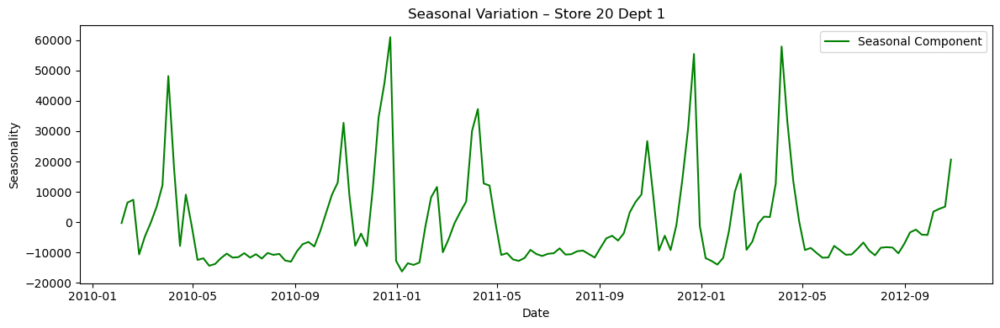

In [63]:
example['Seasonal'] = result.seasonal
plt.figure(figsize=(12,4))
plt.plot(example.index, example['Seasonal'], label='Seasonal Component', color='green')
plt.title(f'Seasonal Variation – Store {store} Dept {dept}')
plt.xlabel('Date')
plt.ylabel('Seasonality')
plt.legend()
plt.tight_layout()
plt.show()

This graph illustrates the **Seasonal Variation** of sales for Store 20, Dept 1. The green line represents the seasonal component extracted from the sales data, highlighting patterns that recur regularly over time. Peaks and troughs indicate periods of higher and lower sales, likely due to factors such as holidays, promotions, or other recurring events. Understanding these seasonal patterns helps in planning and optimizing inventory and marketing strategies.

#### Compare Trends Across Departments

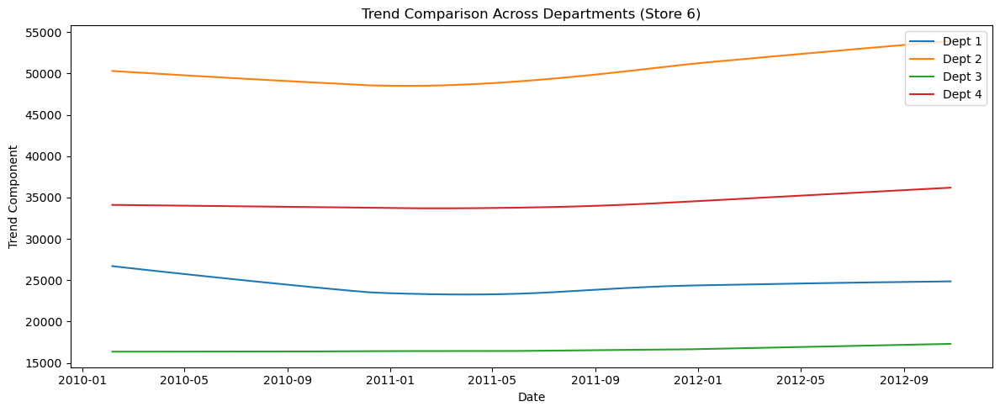

In [65]:
plt.figure(figsize=(12,5))
for dept_id in range(1,5):
    group = df[(df['Store'] == 6) & (df['Dept'] == dept_id)].copy()
    group = group.set_index('Date').sort_index().asfreq('W-FRI')
    group['Weekly_Sales'] = group['Weekly_Sales'].interpolate()
    if group.shape[0] > 10:
        stl = STL(group['Weekly_Sales'], seasonal=13)
        trend = stl.fit().trend
        plt.plot(group.index, trend, label=f'Dept {dept_id}')

plt.title('Trend Comparison Across Departments (Store 6)')
plt.xlabel('Date')
plt.ylabel('Trend Component')
plt.legend()
plt.tight_layout()

This graph illustrates the sales trends for different departments in Store 6:

- **Dept 1 (Blue)**: Slight downward trend, indicating a gradual decline in sales.
- **Dept 2 (Orange)**: Minor upward trend, suggesting slight sales growth.
- **Dept 3 (Green)**: Mostly stable, with minimal change.
- **Dept 4 (Red)**: Steady upward trend, reflecting consistent growth.

This analysis helps identify departments experiencing growth or decline, aiding in strategic planning.

---

## 6. Data Visualization and Analysis

In [66]:
# Extract time-based features
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['WeekOfYear'] = df['Date'].dt.isocalendar().week
df['DayOfWeek'] = df['Date'].dt.dayofweek

#### 6.1. Weekly Sales Distribution

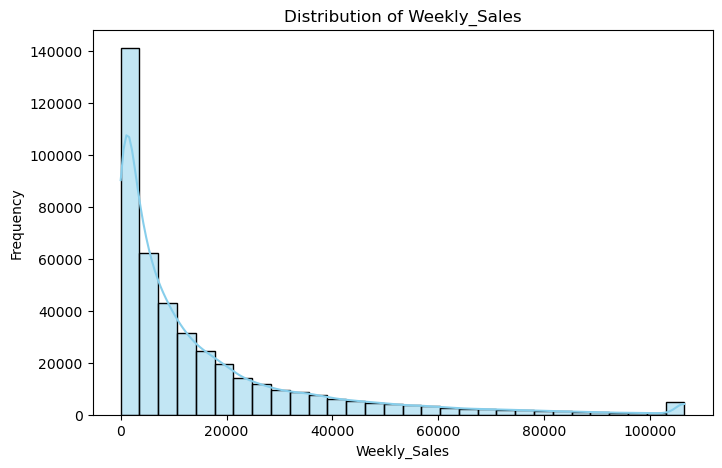

In [67]:
plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='Weekly_Sales', kde=True, bins=30, color='skyblue')
plt.title('Distribution of Weekly_Sales')
plt.xlabel('Weekly_Sales')
plt.ylabel('Frequency')
plt.show()

This histogram depicts the **Distribution of Weekly Sales**. The data is right-skewed, with most sales figures clustered at lower values. The frequency decreases as sales values increase, indicating that high sales figures are less common. This distribution helps identify typical sales patterns and outlier sales performances.

In [68]:
df.head()

,Store,Dept,Date,anomaly_consensus,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,...,CPI,Unemployment,IsHoliday,anomaly_stl,anomaly_spc,anomaly_iso,Year,Month,WeekOfYear,DayOfWeek
0,1,1,2010-02-05,0,24924.50,A,151315,42.31,2.572,0.0,...,211.096358,8.106,False,False,False,False,2010,2,5,4
1,1,1,2010-02-12,0,46039.49,A,151315,38.51,2.565,0.0,...,211.242170,8.106,True,False,False,True,2010,2,6,4
2,1,1,2010-02-19,0,41595.55,A,151315,39.93,2.565,0.0,...,211.289143,8.106,False,False,False,True,2010,2,7,4
3,1,1,2010-02-26,0,19403.54,A,151315,46.63,2.565,0.0,...,211.319643,8.106,False,False,False,False,2010,2,8,4
4,1,1,2010-03-05,0,21827.90,A,151315,46.50,2.625,0.0,...,211.350143,8.106,False,False,False,False,2010,3,9,4


#### 6.2. Temperature Distribution

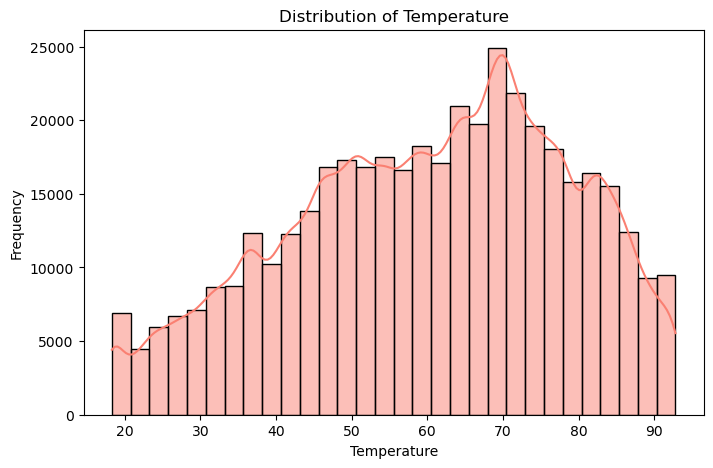

In [69]:
plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='Temperature', kde=True, bins=30, color='salmon')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()

This histogram displays the **Distribution of Temperature**. It follows a roughly normal distribution, peaking around 70 degrees. The frequencies taper off symmetrically on either side of the peak, indicating most temperatures fall within a mid-range cluster. This distribution helps identify typical temperature ranges and assess variability.

#### 6.3. Fuel Price Distribution

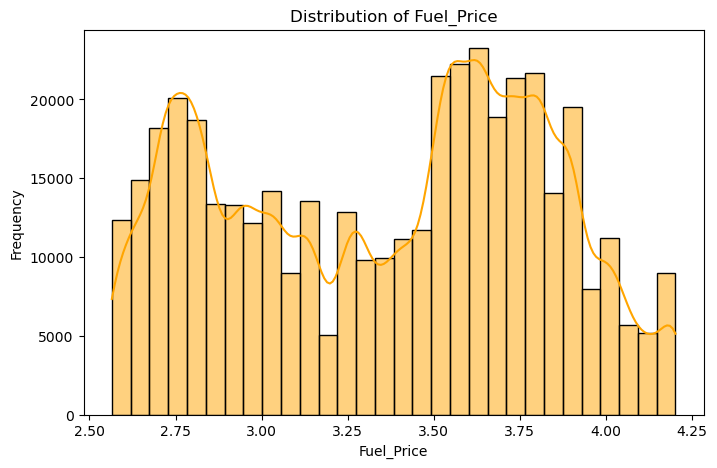

In [70]:
plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='Fuel_Price', kde=True, bins=30, color='orange')
plt.title('Distribution of Fuel_Price')
plt.xlabel('Fuel_Price')
plt.ylabel('Frequency')
plt.show()

This histogram illustrates the **Distribution of Fuel Price**. It shows multiple peaks, suggesting a multimodal distribution. The highest frequency occurs around 3.50 USD  to  4.00 USD. This variation may reflect changes in economic conditions or market dynamics. Understanding this distribution helps assess the impact of fuel price changes over time.

#### 6.4. CPI Distribution

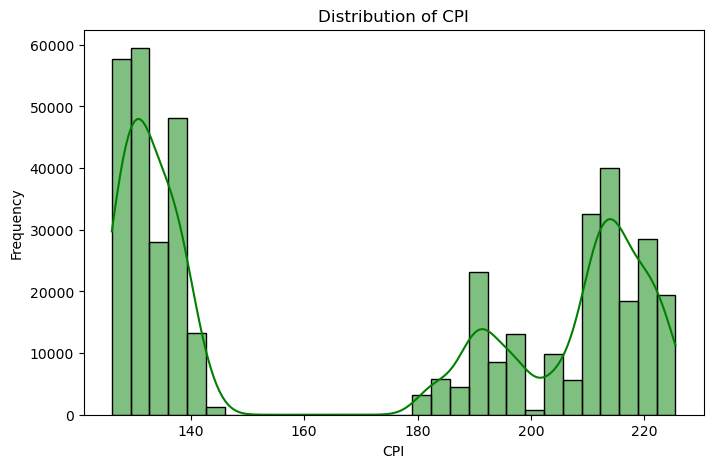

In [71]:
plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='CPI', kde=True, bins=30, color='green')
plt.title('Distribution of CPI')
plt.xlabel('CPI')
plt.ylabel('Frequency')
plt.show()

This histogram shows the **Distribution of CPI** (Consumer Price Index). It has a bimodal distribution with peaks around 130 and 210, indicating two distinct groups in the dataset. These variations may reflect changes in economic conditions over time. Understanding this distribution helps analyze inflation trends and cost-of-living adjustments.

#### 6.5. Overall Sales Trend

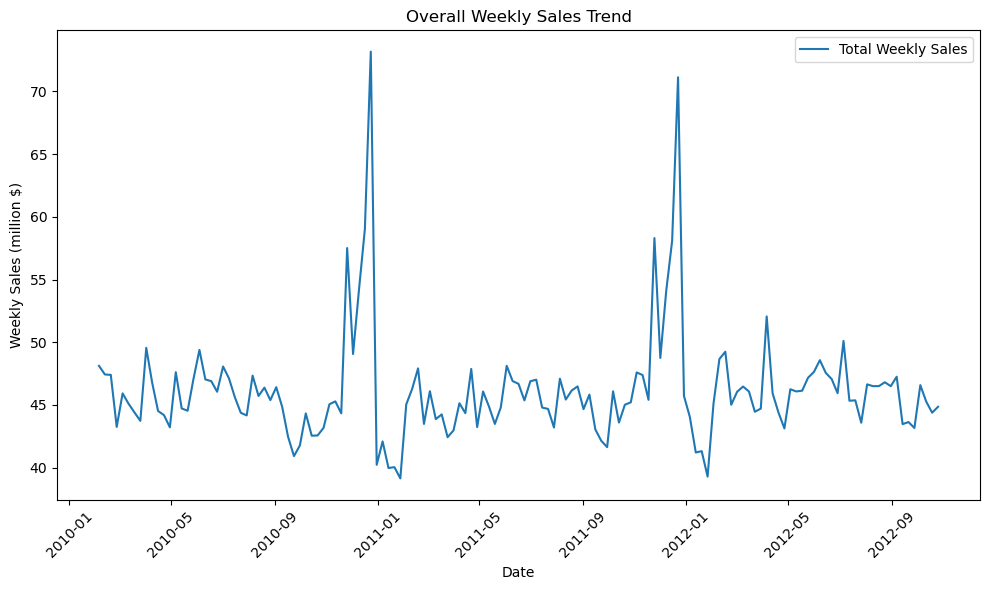

In [72]:
plt.figure(figsize=(10, 6))
overall_sales = df.groupby('Date')['Weekly_Sales'].sum()
# Convert sales to millions for better readability
overall_sales_millions = overall_sales / 1e6
plt.plot(overall_sales_millions.index, overall_sales_millions.values, label='Total Weekly Sales')
plt.title('Overall Weekly Sales Trend')
plt.xlabel('Date')
plt.ylabel('Weekly Sales (million $)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

This line graph illustrates the **Overall Weekly Sales Trend** over time. The data shows periodic peaks (Dec'2010 and Dec'2011), likely corresponding to high-demand seasons or events. After each peak, sales return to a steadier, lower range. These patterns help in understanding sales fluctuations and planning inventory and marketing strategies.

#### 6.6. Sales Trend Per Store - Top 5 Stores

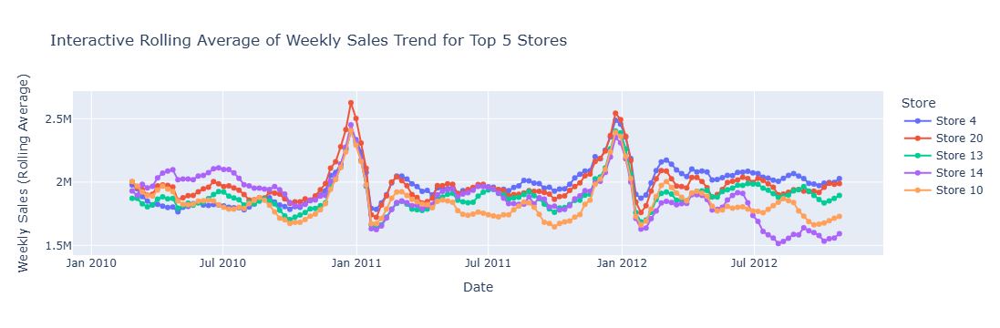

In [73]:
import pandas as pd
import plotly.express as px

# Calculate the rolling average for weekly sales
window_size = 4
top_stores = df.groupby('Store')['Weekly_Sales'].sum().nlargest(5).index

# Prepare data for Plotly by calculating rolling averages
plot_data = []

for store in top_stores:
    store_data = df[df['Store'] == store].groupby('Date')['Weekly_Sales'].sum().rolling(window=window_size).mean()
    temp_df = pd.DataFrame({
        'Date': store_data.index,
        'Weekly_Sales': store_data.values,
        'Store': f'Store {store}'
    })
    plot_data.append(temp_df)

# Concatenate all the data for Plotly
plot_data = pd.concat(plot_data)

# Create the interactive plot
fig = px.line(plot_data, x='Date', y='Weekly_Sales', color='Store',
              title='Interactive Rolling Average of Weekly Sales Trend for Top 5 Stores')

fig.update_traces(mode='lines+markers')
fig.update_layout(xaxis_title='Date', yaxis_title='Weekly Sales (Rolling Average)')
fig.show()

This interactive line graph shows the **Rolling Average Trend of Weekly Sales for the Top 5 Stores**. Each colored line represents a store's sales trend over time. The graph smooths short-term fluctuations, highlighting broader trends and seasonal patterns. Peaks suggest high-demand periods, while rolling averages enable comparison across stores, helping identify performance variations.

#### 6.7. Sales Trend Per Department (Top 5 Departments)

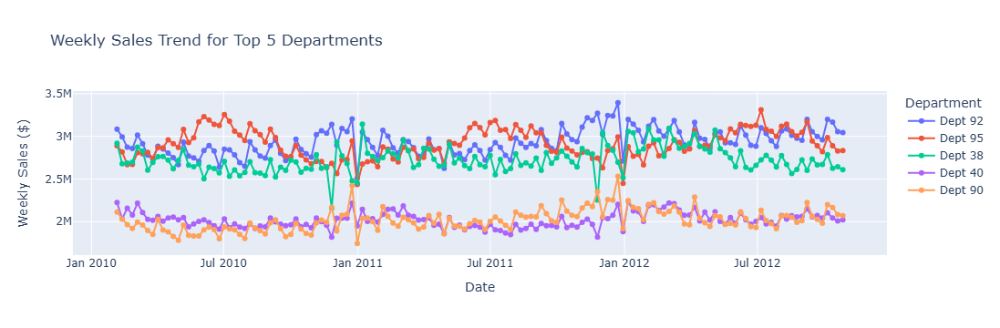

In [74]:
import pandas as pd
import plotly.express as px

# Determine the top 5 departments by total sales
top_depts = df.groupby('Dept')['Weekly_Sales'].sum().nlargest(5).index

# Prepare data for Plotly
plot_data = []

for dept in top_depts:
    dept_data = df[df['Dept'] == dept].groupby('Date')['Weekly_Sales'].sum()
    temp_df = pd.DataFrame({
        'Date': dept_data.index,
        'Weekly_Sales': dept_data.values,
        'Department': f'Dept {dept}'
    })
    plot_data.append(temp_df)

# Concatenate data for Plotly
plot_data = pd.concat(plot_data)

# Create the interactive plot
fig = px.line(plot_data, x='Date', y='Weekly_Sales', color='Department',
              title='Weekly Sales Trend for Top 5 Departments')

fig.update_traces(mode='lines+markers')
fig.update_layout(xaxis_title='Date', yaxis_title='Weekly Sales ($)')
fig.show()

This interactive line graph displays the **Weekly Sales Trend for the Top 5 Departments**. Each line represents sales over time for a different department, showing fluctuations and seasonal patterns. Peaks indicate high-demand periods. This visualization helps compare performance across departments and identify trends and cyclical behaviors in sales.

#### 6.8. Seasonality - Monthly Sales

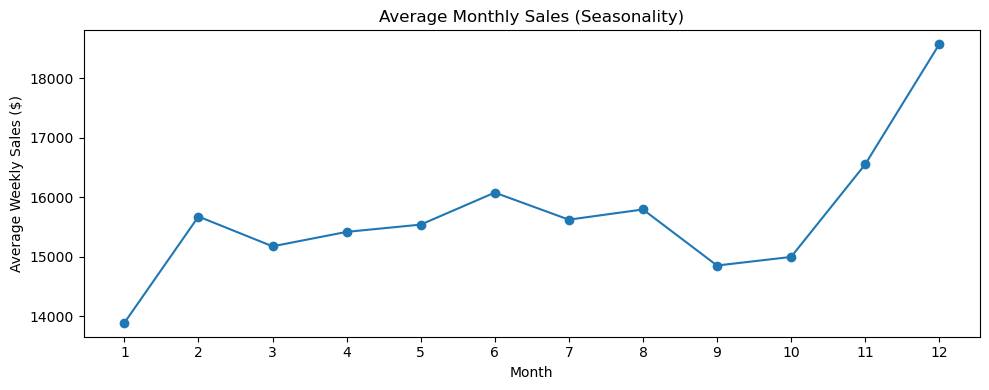

In [77]:
plt.figure(figsize=(10, 4))
monthly_sales = df.groupby('Month')['Weekly_Sales'].mean()
plt.plot(monthly_sales.index, monthly_sales.values, marker='o')
plt.title('Average Monthly Sales (Seasonality)')
plt.xlabel('Month')
plt.ylabel('Average Weekly Sales ($)')
plt.xticks(range(1, 13))
plt.tight_layout()
plt.show()

This line graph presents the **Average Monthly Sales (Seasonality)**. Each point shows the average weekly sales for a given month, highlighting monthly sales patterns. Noticeable peaks occur in ***December***, indicating increased sales during the holiday season. This visualization helps identify seasonal trends and plan for high and low sales months.

### 6.9. Impact of External Factors

#### 6.9.1. Impact of External Factors - CPI

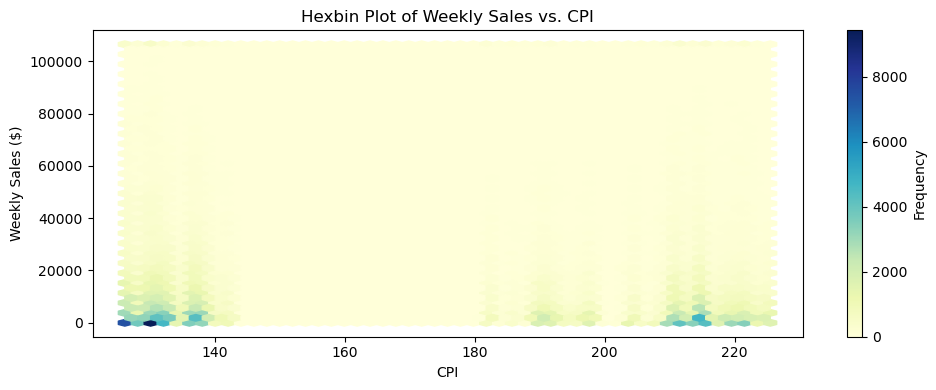

In [78]:
plt.figure(figsize=(10, 4))
plt.hexbin(df['CPI'], df['Weekly_Sales'], gridsize=50, cmap='YlGnBu')
plt.colorbar(label='Frequency')
plt.title('Hexbin Plot of Weekly Sales vs. CPI')
plt.xlabel('CPI')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

This hexbin plot shows the relationship between **Weekly Sales and CPI** (Consumer Price Index). Each hexagon represents the frequency of data points falling within it. Darker areas indicate higher concentrations of data. The plot suggests a concentration of sales at lower CPI values, helping to visualize correlations between economic conditions and sales.

#### 6.9.2. Impact of External Factors - Fuel Price

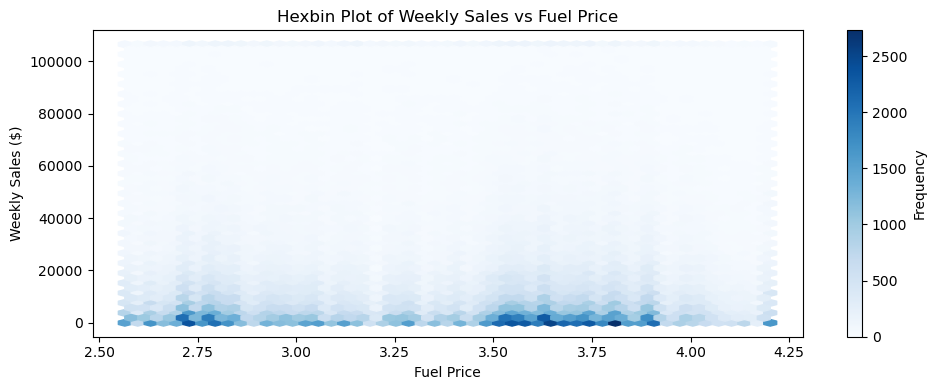

In [82]:
plt.figure(figsize=(10, 4))
plt.hexbin(df['Fuel_Price'], df['Weekly_Sales'], gridsize=50, cmap='Blues')
plt.colorbar(label='Frequency')
plt.title('Hexbin Plot of Weekly Sales vs Fuel Price')
plt.xlabel('Fuel Price')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

The hexbin plot shows how **Weekly Sales** vary with **Fuel Price**. Most sales data are concentrated at lower sales values regardless of fuel price, as indicated by the darker hexagons near the bottom. This suggests that weekly sales don't significantly fluctuate with changes in fuel prices, indicating a weak correlation between these variables.

#### 6.9.3. Impact of External Factors - Unemployment

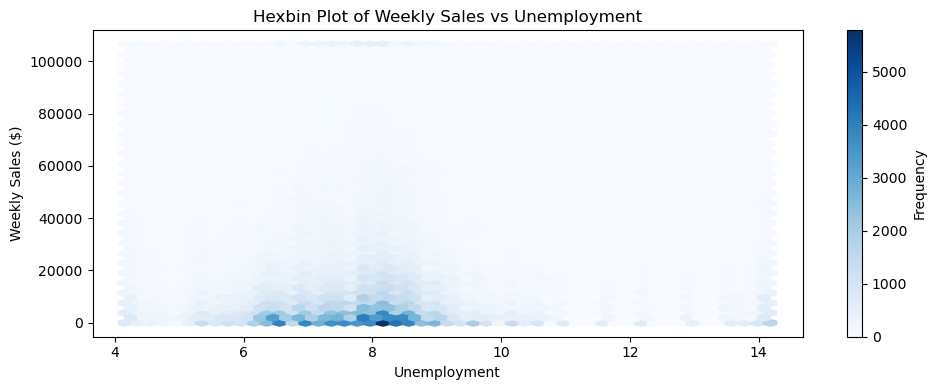

In [86]:
plt.figure(figsize=(10, 4))
plt.hexbin(df['Unemployment'], df['Weekly_Sales'], gridsize=50, cmap='Blues')
plt.colorbar(label='Frequency')
plt.title('Hexbin Plot of Weekly Sales vs Unemployment')
plt.xlabel('Unemployment')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

The hexbin plot visualizes the relationship between **Weekly Sales and Unemployment**. Darker hexagons represent higher densities of data points, indicating where data is clustered. It reveals that most sales occur at lower unemployment rates, with a concentration at lower weekly sales values. This helps in understanding possible correlations or patterns between unemployment levels and sales performance, suggesting that sales are predominantly clustered around certain unemployment levels.

#### 6.9.4. Impact of External Factors - Temperature

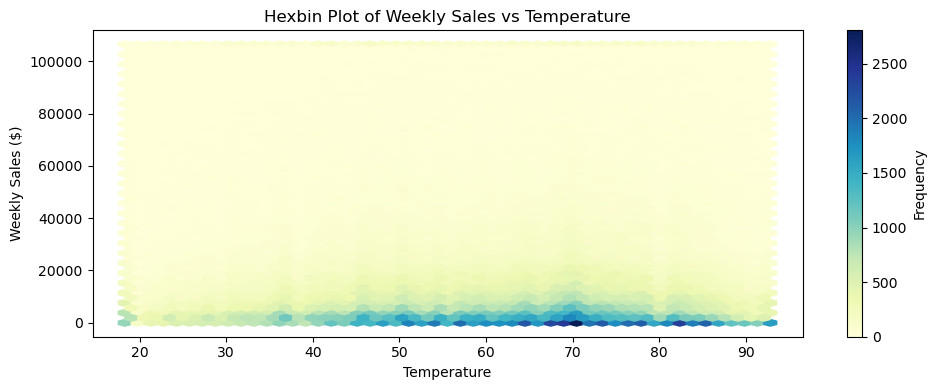

In [87]:
plt.figure(figsize=(10, 4))
plt.hexbin(df['Temperature'], df['Weekly_Sales'], gridsize=50, cmap='YlGnBu')
plt.colorbar(label='Frequency')
plt.title('Hexbin Plot of Weekly Sales vs Temperature')
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

The hexbin plot visualizes the relationship between **Weekly Sales and Temperature**, with darker hexagons indicating higher data point densities. The plot shows that most sales occur at moderate temperature ranges, with a concentration of sales at lower weekly sales values. This visualization aids in identifying possible correlations or patterns between temperature variations and sales performance, highlighting that sales cluster around specific temperature levels.

#### 6.10. Holiday vs Non-Holiday Sales

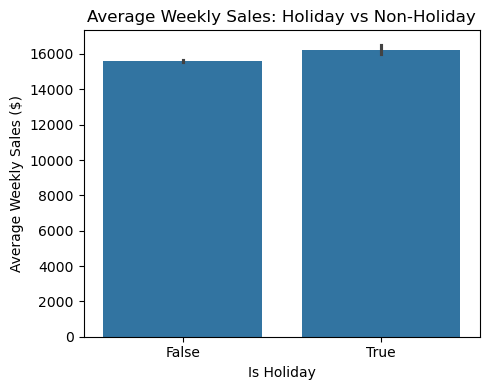

In [90]:
plt.figure(figsize=(5, 4))
sns.barplot(x='IsHoliday', y='Weekly_Sales', data=df)
plt.title('Average Weekly Sales: Holiday vs Non-Holiday')
plt.xlabel('Is Holiday')
plt.ylabel('Average Weekly Sales ($)')
plt.tight_layout()
plt.show()

The bar chart compares **average weekly sales during holiday periods and non-holiday periods**. It shows that average sales are slightly higher during holidays compared to non-holidays. This visualization highlights the impact of holidays on sales performance, indicating a modest increase in sales during holiday weeks.

#### 6.11. Average Weekly Sales by Store Type

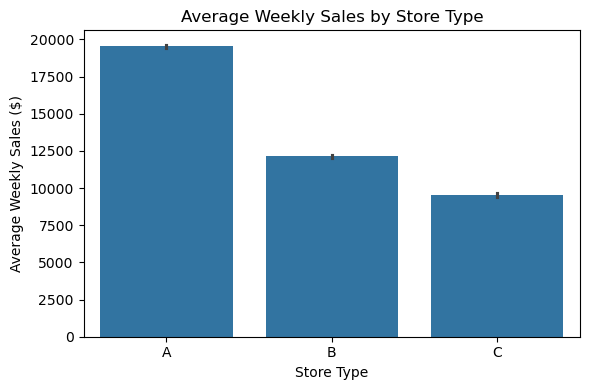

In [91]:
# Average sales by store type
plt.figure(figsize=(6, 4))
sns.barplot(x='Type', y='Weekly_Sales', data=df, order=['A', 'B', 'C'])
plt.title('Average Weekly Sales by Store Type')
plt.xlabel('Store Type')
plt.ylabel('Average Weekly Sales ($)')
plt.tight_layout()
plt.show()

The bar chart illustrates **average weekly sales across different store types**. Store Type A shows the highest average sales, while Type C has the lowest. This visualization highlights the differences in sales performance across store types, suggesting that Store Type A is the most successful in terms of sales.

#### 6.12. Store Size vs. Weekly Sales by Type

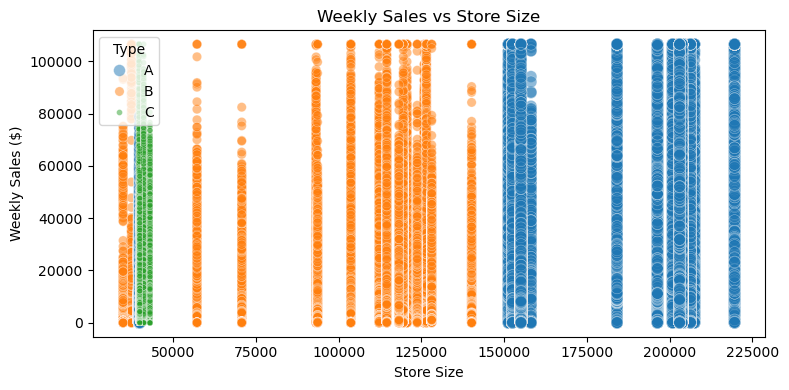

In [94]:
plt.figure(figsize=(8, 4))
sns.scatterplot(x='Size', y='Weekly_Sales', hue='Type', size='Type', data=df, alpha=0.5)
plt.title('Weekly Sales vs Store Size')
plt.xlabel('Store Size')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

The scatter plot shows the relationship between **store size and weekly sales, categorized by store type**:

- **Type A**: Larger sizes with higher sales, indicating strong performance.
- **Type B**: Moderate sizes and sales, displaying consistency.
- **Type C**: Smaller sizes and sales, suggesting more limited performance.

Larger stores typically achieve higher sales, with Type A leading overall.

#### 6.13. Total Markdown effect on Weekly Sales

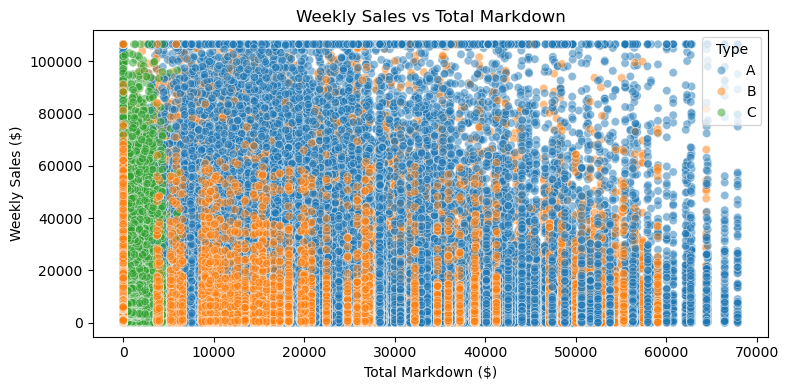

In [95]:
markdown_cols = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
df['Total_MarkDown'] = df[markdown_cols].sum(axis=1)
plt.figure(figsize=(8, 4))
sns.scatterplot(x='Total_MarkDown', y='Weekly_Sales', hue='Type', data=df, alpha=0.5)
plt.title('Weekly Sales vs Total Markdown')
plt.xlabel('Total Markdown ($)')
plt.ylabel('Weekly Sales ($)')
plt.tight_layout()
plt.show()

The scatter plot illustrates the relationship between **weekly sales and total markdown, segmented by store type (A, B, C)**. Higher markdowns generally correlate with higher sales, especially for Store Type A. Types B and C have lower markdowns and sales, with a denser concentration at the lower end. This suggests markdowns may enhance sales, particularly in larger stores.

#### 6.14. Impact of Markdown on Weekly Sales Across Store Types

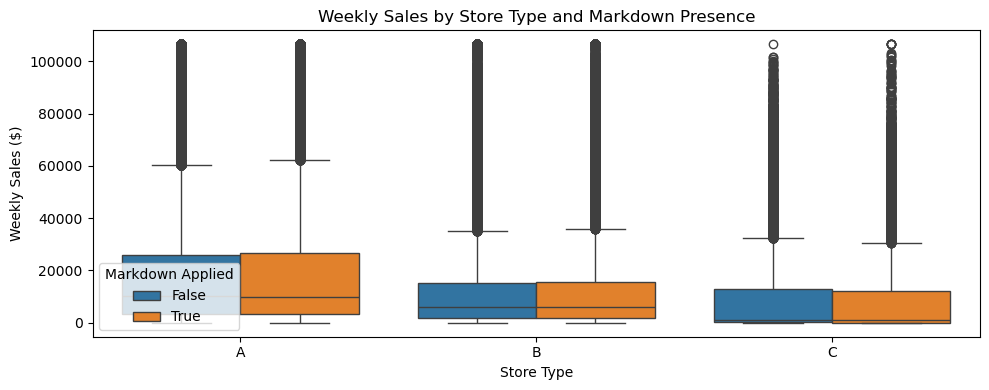

In [96]:
plt.figure(figsize=(10, 4))
sns.boxplot(x='Type', y='Weekly_Sales', hue=df['Total_MarkDown'] > 0, data=df)
plt.title('Weekly Sales by Store Type and Markdown Presence')
plt.xlabel('Store Type')
plt.ylabel('Weekly Sales ($)')
plt.legend(title='Markdown Applied')
plt.tight_layout()
plt.show()

The box plot illustrates the effect of **markdown presence on weekly sales for different store types (A, B, C)**. Stores with markdowns (orange) show slightly higher median sales, especially in Types A and B. Type C shows less variation. The presence of markdowns enhances median sales, particularly in larger stores.

#### 6.15. Variability in Average Weekly Sales Across Departments

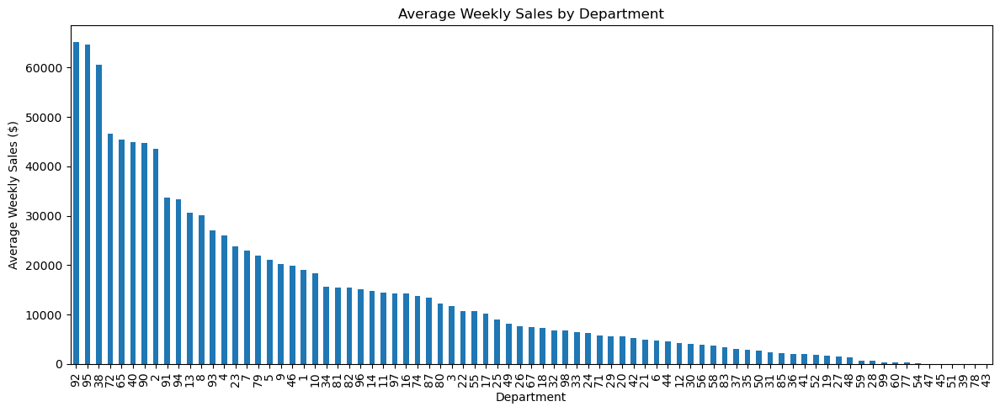

In [98]:
dept_sales = df.groupby('Dept')['Weekly_Sales'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 5))
dept_sales.plot(kind='bar')
plt.title('Average Weekly Sales by Department')
plt.xlabel('Department')
plt.ylabel('Average Weekly Sales ($)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

The bar chart displays **average weekly sales for each department**, highlighting significant variability:

- **Top Performers**: Departments 92, 95, and 38 show the highest sales, exceeding 60,000, indicating strong consumer demand.
- **Moderate Performers**: About 19 different departments have sales between 20,000 and 40,000, showing steady contributions.
- **Lower Performers**: Majority of the departments have sales < 20,000, with some departments like 43 and 78 with < 5,000, suggesting limited sales impact.

This variability underscores differences in product popularity and departmental focus within the overall sales strategy.

#### 6.16. Correlation Matrix

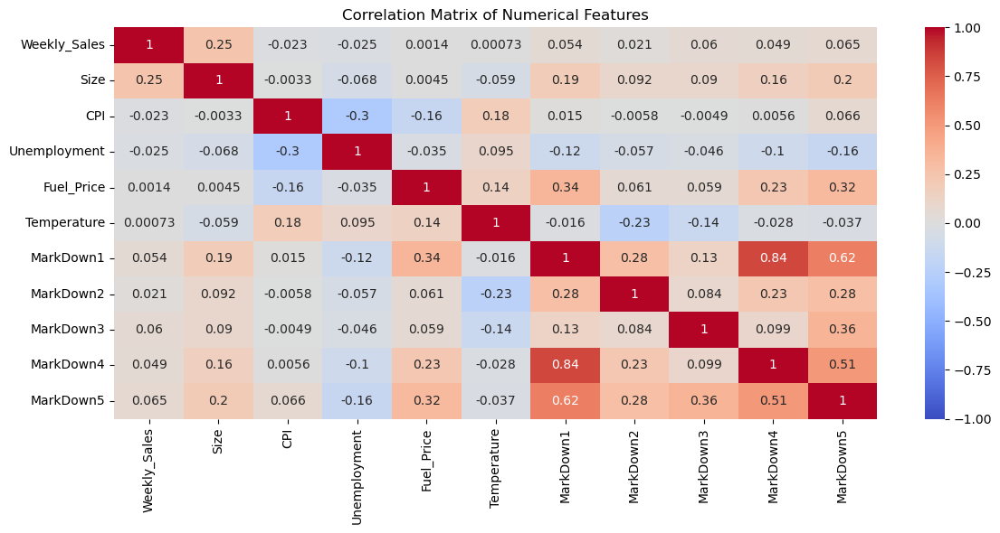

In [99]:
plt.figure(figsize=(12, 6))
numeric_cols = ['Weekly_Sales', 'Size', 'CPI', 'Unemployment', 'Fuel_Price', 'Temperature'] + markdown_cols
corr_matrix = df[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Matrix of Numerical Features')
plt.tight_layout()
plt.show()

This correlation matrix displays **relationships between numerical features**:

- **Weekly Sales**: Positively correlated with store size (0.25).
- **Fuel Price**: Shows a moderate positive correlation with some markdowns, particularly MarkDown1 (0.34).
- **CPI & Unemployment**: Negatively correlated, indicating inverse relationships (-0.3).
- **MarkDowns**: Strong inter-correlations, especially between MarkDown1 and MarkDown4 (0.84).

The matrix highlights key interactions, aiding in understanding feature impacts on sales.

---

## 7. Market Basket Analysis

**How Does Market Basket Analysis Work?**

- ***Collect data*** on customer transactions, such as the items purchased in each transaction, the time and date of the transaction, and any other relevant information.
- ***Clean and preprocess the data***, removing any irrelevant information, handling missing values, and converting the data into a suitable format for analysis.
- ***Use association rules mining algorithms*** such as Apriori or FP-Growth to identify frequent item sets, sets of items often appearing together in a transaction.
- ***Calculate the support and confidence for each frequent itemset***, expressing the likelihood of one item being purchased given the purchase of another item.
- ***Generate association rules based on the frequent itemsets and their corresponding support and confidence values***. Association rules indicate the likelihood of purchasing one item given the purchase of another item.
- ***Interpret the results*** of the market basket analysis, identifying frequent purchases, assessing the strength of the association between items, and uncovering other relevant insights into customer behavior and preferences.
- ***Use the insights*** from the market basket analysis ***to inform business decisions*** such as product recommendations, store layout optimization, and targeted marketing campaigns.

**Algorithms Used in Market Basket Analysis**

There are multiple data mining techniques and algorithms used in Market Basket Analysis.

- Apriori Algorithm
- AIS
- SETM Algorithm
- FP Growth

In predicting the probability of items that customers are buying together, one of the important objectives is to achieve accuracy.

***Here, the Apriori Algorithm is used for Market Basket Analysis.***

**Apriori Algorithm**

The Apriori Algorithm widely uses and is well-known for Association Rule mining, making it a popular choice in market basket analysis. It helps to find frequent itemsets in transactions and identifies association rules between these items. The limitation of the Apriori Algorithm is frequent itemset generation. It needs to scan the database many times, leading to increased time and reduced performance as a computationally costly step because of a large dataset. It uses the concepts of Confidence and Support.

In [238]:
sales_df['IsHoliday']=sales_df['IsHoliday'].apply(lambda x: 1 if x=='True' else 0)

In [239]:
relevant_stores = np.array(sales_df['Store'].value_counts().index) # Example list of department numbers to analyze
sales_data_filtered = sales_df[sales_df['Store'].isin(relevant_stores)]
sales_data_filtered.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,0
1,1,1,12/02/2010,46039.49,0
2,1,1,19/02/2010,41595.55,0
3,1,1,26/02/2010,19403.54,0
4,1,1,05/03/2010,21827.90,0


In [240]:
# Creating a DataFrame for Association Rule Mining
# Convert sales data into a transaction format
transactions = sales_data_filtered.groupby(['Date','Dept'])['Store'].apply(list).reset_index(name='Stores')

In [250]:
sales

,Date,Dept,Stores
0,01/04/2011,1,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
1,01/04/2011,2,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
2,01/04/2011,3,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
3,01/04/2011,4,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
4,01/04/2011,5,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
5,01/04/2011,6,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
6,01/04/2011,7,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
7,01/04/2011,8,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
8,01/04/2011,9,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
9,01/04/2011,10,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."


Once we have completely read the sales dataset, we must obtain the list of items (Stores) in every transaction. So we'll run two loops. One will be for the total number of transactions, and the other for the total number of columns in every transaction.

The list will work as a training set from where we can generate the list of Association Rules.

In [242]:
l=[]
for i in range(0,11090):
    l.append([str(transactions.values[i,j]) for j in range(0,3)])

Now, we are ready with the list of items in our training set. Next, we run the apriori algorithm with certain assumed values for support, confidence, lift and length, which will learn the list of association rules from the training set, i.e., list.

In [243]:
# Applying apriori algorithm
association_rules = apriori(l, min_support=0.011, min_confidence=0.8, min_lift=3, min_length=2)
association_results = list(association_rules)

In [244]:
for i in range(0, len(association_results)):
    print(association_results[i][0])

frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '29'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '30'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '35'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '36'})
frozenset({'37', '[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27, 28, 31, 32, 34, 40]'})
frozenset({'[34]', '65'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '71'})


In [245]:
# Display the Rule, Support, and Lift ratio for every above association rule by using for loop.
for item in association_results:
    # first index of the inner list
    # Contains base item and add item
    pair = item[0]
    items = [x for x in pair]
    print("Rule: " + items[0] + " -> " + items[1])
    # second index of the inner list
    print("Support: " + str(item[1]))
    # third index of the list located at 0th position
    # of the third index of the inner list
    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("-----------------------------------------------------")

Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 29
Support: 0.011361587015329125
Confidence: 0.8811188811188811
Lift: 8.380453166044934
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 30
Support: 0.012894499549143372
Confidence: 1.0
Lift: 9.51114922813036
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 35
Support: 0.012353471596032463
Confidence: 0.9580419580419581
Lift: 9.112080029747268
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 4

In [246]:
# Create lists to hold the data for each association rule
rules = []
supports = []
confidences = []
lifts = []

# Iterate over the association_results and extract information
for item in association_results:
    rules.append(item[0])
    supports.append(item[1])
    confidences.append(item[2][0][2])
    lifts.append(item[2][0][3])

# Create a DataFrame to display the association results
association_df = pd.DataFrame({
    'Rule': rules,
    'Support': supports,
    'Confidence': confidences,
    'Lift': lifts
})

# Convert frozenset to tuple
association_df['Rule'] = association_df['Rule'].apply(lambda x: tuple(x))

# Splitting the Rule column into Antecedent and Consequent
association_df[['Antecedent', 'Consequent']] = pd.DataFrame(association_df['Rule'].tolist(), index=association_df.index)

# Drop the original Rule column
association_df.drop(columns=['Rule'], inplace=True)

# Reorder columns
association_df = association_df[['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift']]


In [249]:
association_df.sort_values(by='Confidence',ascending=False).reset_index(drop=True)

,Antecedent,Consequent,Support,Confidence,Lift
0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",30,0.012894,1.000000,9.511149
1,[34],65,0.012894,1.000000,76.482759
2,37,"[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27...",0.012624,0.979021,77.552448
3,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",36,0.012353,0.958042,9.112080
4,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",35,0.012353,0.958042,9.112080
5,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",29,0.011362,0.881119,8.380453
6,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",71,0.011271,0.874126,8.313942


**Association Rule Analysis (Store → Department Relationships)**

The Apriori algorithm uncovered several strong associations between stores (antecedents) and departments (consequents), offering insights into co-occurrence patterns across locations.

**High Confidence (≈1.0):**
Most rules show a confidence close to 100%, meaning that when these stores are active (or have transactions), the associated departments almost always appear as well. This indicates strong operational or sales dependencies between specific stores and departments.

**Significant Lift Values:**
The lift values (ranging up to ~77) suggest that the likelihood of these departments appearing alongside the given stores is many times higher than by random chance. For example, Store 34’s association with Department 65 (Lift = 76.48) highlights a particularly strong and unique relationship; potentially reflecting a specialized product line or regional demand.

**Frequent Store Clusters:**
Large antecedent groups (e.g., Stores [1–14, ...]) linked with departments such as 30, 35, or 36 indicate broadly shared demand patterns across multiple outlets, suggesting centralized assortment or uniform performance across these stores.

**Strategic Implication:**
These associations can inform inventory alignment, promotional targeting, or category clustering — ensuring that departments with high affinity to certain stores are prioritized in stocking, marketing, or layout decisions.

### Cross-Selling Strategies Based on Store–Department Associations

**Store-Specific Cross-Promotions**
- Stores like #34 and #37 exhibit exceptionally strong affinities with Departments 65 and multiple others, respectively.
- Leverage this by bundling complementary items or running localized promotions that highlight these departments’ popular products (e.g., “Top Picks from Department 65 – Only at Store 34”).
- This can strengthen customer retention in those regions and maximize wallet share per visit.

**Cluster-Based Merchandising**
- The large store clusters ([1–14, etc.]) consistently associated with departments such as 30, 35, and 36 indicate uniform purchasing behavior.
- Implement standardized cross-merchandising layouts or joint discount schemes across these stores — for instance, promoting a “Department 30 + 35 Combo Deal” chain-wide to capitalize on similar demand patterns.

**Inventory Pairing for High-Lift Departments**
- Departments with lift > 70 (like 65) are highly predictive of co-occurrence.
- Position these products together in digital recommendations (“Customers at Store 34 often buy from Dept. 65 — explore related items”) or physical placements (shared endcaps or adjacent aisles).

**Event-Based Cross-Selling**
- Use the high-confidence store-department relationships to plan targeted campaigns during seasonal peaks or holidays.
- Example: Stores 1–14 frequently correlate with Dept. 30 — create coordinated holiday bundles or “Buy More, Save More” offers featuring Dept. 30’s products during festive demand surges.

**Personalized Recommendations at Checkout**
- Incorporate these rules into your POS or online checkout recommendation engine.
- When a customer from Store 37 purchases from a specific department, automatically suggest items from its frequently co-occurring departments, using the association rules as the logic backbone.

---

## 8. Feature Engineering

### Adding New Features

### 1. Time Based Features

In [104]:
# Ensure IsHoliday is binary (0 or 1)
df['IsHoliday'] = df['IsHoliday'].fillna(0)
df['IsHoliday'] = df['IsHoliday'].astype(int)

#### 1A. Days from Holiday Features

In [108]:
# Ensure 'Date' column is datetime64
df['Date'] = pd.to_datetime(df['Date'])

# Extract holiday dates from IsHoliday column
holiday_dates = df[df['IsHoliday'] == True]['Date'].unique()
holidays_df = pd.DataFrame({'HolidayDate': pd.to_datetime(holiday_dates)})

# Sort holidays_df to ensure chronological order for searchsorted
holidays_df = holidays_df.sort_values('HolidayDate')

# Calculate DaysSinceLastHoliday
last_holiday_idx = holidays_df['HolidayDate'].searchsorted(df['Date'], side='right') - 1
last_holiday_dates = holidays_df['HolidayDate'].iloc[last_holiday_idx.clip(0)].values
df['DaysSinceLastHoliday'] = (df['Date'] - last_holiday_dates).dt.days
df.loc[last_holiday_idx < 0, 'DaysSinceLastHoliday'] = np.nan  # Assign NaN if no past holiday

# Calculate DaysUntilNextHoliday
next_holiday_idx = holidays_df['HolidayDate'].searchsorted(df['Date'], side='left')
next_holiday_dates = holidays_df['HolidayDate'].iloc[next_holiday_idx.clip(0, len(holidays_df) - 1)].values
df['DaysUntilNextHoliday'] = (next_holiday_dates - df['Date']).dt.days
df.loc[next_holiday_idx >= len(holidays_df), 'DaysUntilNextHoliday'] = np.nan  # Assign NaN if no future holiday

# Replace NaN with 0
df['DaysSinceLastHoliday'] = df['DaysSinceLastHoliday'].fillna(0)
df['DaysUntilNextHoliday'] = df['DaysUntilNextHoliday'].fillna(0)

# Display first few rows to verify
print(df[['Date', 'IsHoliday', 'DaysSinceLastHoliday', 'DaysUntilNextHoliday']].head(10))

        Date  IsHoliday  DaysSinceLastHoliday  DaysUntilNextHoliday
0 2010-02-05          0                   0.0                   7.0
1 2010-02-12          1                   0.0                   0.0
2 2010-02-19          0                   7.0                 203.0
3 2010-02-26          0                  14.0                 196.0
4 2010-03-05          0                  21.0                 189.0
5 2010-03-12          0                  28.0                 182.0
6 2010-03-19          0                  35.0                 175.0
7 2010-03-26          0                  42.0                 168.0
8 2010-04-02          0                  49.0                 161.0
9 2010-04-09          0                  56.0                 154.0


This code calculates two new features for each date in a sales dataset:

- **DaysSinceLastHoliday**: Represents the number of days since the last holiday occurred. If no past holiday is present, it defaults to zero.
- **DaysUntilNextHoliday**: Indicates the number of days until the next holiday. If no future holiday exists, it defaults to zero.

These features provide insights into potential sales impacts related to holiday proximity, enabling better forecasting and planning around holiday-related sales fluctuations.

#### 1B. Weeks around Holiday Features

In [106]:
# Calculate WeekBeforeHoliday and WeekAfterHoliday
df['WeekBeforeHoliday'] = 0
df['WeekAfterHoliday'] = 0

for hdate in holiday_dates:
    # Week before: 1 to 7 days before the holiday
    week_before_start = hdate - pd.Timedelta(days=7)
    week_before_end = hdate
    df.loc[(df['Date'] >= week_before_start) & (df['Date'] < week_before_end), 'WeekBeforeHoliday'] = 1

    # Week after: 0 to 7 days after the holiday
    week_after_start = hdate
    week_after_end = hdate + pd.Timedelta(days=7)
    df.loc[(df['Date'] >= week_after_start) & (df['Date'] < week_after_end), 'WeekAfterHoliday'] = 1

This code creates two new features to highlight sales periods around holidays:

- **WeekBeforeHoliday**: Marks the week preceding a holiday (1 to 7 days before).
- **WeekAfterHoliday**: Marks the week following a holiday (0 to 7 days after).

By highlighting these periods, businesses can better analyze sales trends and patterns surrounding holidays. These insights can aid in crafting targeted promotions and inventory strategies to optimize holiday-related sales activities.

#### 1C. Season of the Week

In [107]:
# Define seasons based on Month
# Spring: March (3) to May (5)
# Summer: June (6) to August (8)
# Fall: September (9) to November (11)
# Winter: December (12) to February (2)

def get_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    else:  # 12, 1, 2
        return 'Winter'

df['Season'] = df['Month'].apply(get_season)

df.head()

,Store,Dept,Date,anomaly_consensus,Weekly_Sales,Type,Size,Temperature,Fuel_Price,MarkDown1,...,Year,Month,WeekOfYear,DayOfWeek,Total_MarkDown,DaysSinceLastHoliday,DaysUntilNextHoliday,WeekBeforeHoliday,WeekAfterHoliday,Season
0,1,1,2010-02-05,0,24924.50,A,151315,42.31,2.572,0.0,...,2010,2,5,4,0.0,0.0,7.0,1,0,Winter
1,1,1,2010-02-12,0,46039.49,A,151315,38.51,2.565,0.0,...,2010,2,6,4,0.0,0.0,0.0,0,1,Winter
2,1,1,2010-02-19,0,41595.55,A,151315,39.93,2.565,0.0,...,2010,2,7,4,0.0,7.0,203.0,0,0,Winter
3,1,1,2010-02-26,0,19403.54,A,151315,46.63,2.565,0.0,...,2010,2,8,4,0.0,14.0,196.0,0,0,Winter
4,1,1,2010-03-05,0,21827.90,A,151315,46.50,2.625,0.0,...,2010,3,9,4,0.0,21.0,189.0,0,0,Spring


This code defines seasons based on the month of the year and adds a **"Season"** column to the dataset:

- **Spring**: March (3) to May (5)
- **Summer**: June (6) to August (8)
- **Fall**: September (9) to November (11)
- **Winter**: December (12) to February (2)

By categorizing each month into its respective season, the dataset can be analyzed for seasonal trends in sales, enabling strategic planning and inventory management throughout the year.

### 2. Lagged Features

In [109]:
# Sort df for time-series operations
df = df.sort_values(['Store', 'Dept', 'Date'])

# Create Lagged Features (1 and 2 weeks)
lag_columns = ['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
               'MarkDown5', 'CPI', 'Unemployment', 'Fuel_Price', 'Temperature']

for col in lag_columns:
    for lag in [1, 2]:
        df[f'{col}_Lag_{lag}_Week'] = df.groupby(['Store', 'Dept'])[col].shift(lag)

# Create Rolling Window Features (4 and 12 weeks)
rolling_columns = ['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
for col in rolling_columns:
    for window in [4, 12]:
        grouped = df.groupby(['Store', 'Dept'])[col]
        df[f'{col}_Rolling_Mean_{window}_Week'] = (grouped.rolling(window, min_periods=1).mean().reset_index(level=[0, 1], drop=True).shift(1))
        df[f'{col}_Rolling_Sum_{window}_Week'] = (grouped.rolling(window, min_periods=1).sum().reset_index(level=[0, 1], drop=True).shift(1))
        df[f'{col}_Rolling_Std_{window}_Week'] = (grouped.rolling(window, min_periods=1).std().reset_index(level=[0, 1], drop=True).shift(1))

# Handle Missing Values
# 1. Lag Features: Forward fill within each group
lag_features = [f'{col}_Lag_{lag}_Week' for col in lag_columns for lag in [1, 2]]
df[lag_features] = df.groupby(['Store', 'Dept'])[lag_features].transform(lambda x: x.ffill().bfill())

# 2. Rolling Features: Forward fill, then backward fill within each group
rolling_features = [f'{col}_Rolling_{stat}_{window}_Week'
                    for col in rolling_columns
                    for window in [4, 12]
                    for stat in ['Mean', 'Sum', 'Std']]
df[rolling_features] = df.groupby(['Store', 'Dept'])[rolling_features].transform(lambda x: x.ffill().bfill())

# 3. For any stubborn NaNs (first row in group with no prior or next data), fill with global mean or 0
df[lag_features] = df[lag_features].fillna(df[lag_features].mean())
df[rolling_features] = df[rolling_features].fillna(df[rolling_features].mean())

print("Rows after adding features and imputing missing values:", len(df))
print("Any remaining missing values?", df.isnull().sum().sum())


Rows after adding features and imputing missing values: 421570
Any remaining missing values? 0


This feature engineering process involves creating lagged and rolling window features to capture time-series dependencies:

- **Lagged Features**: For selected columns, ***lagged values are created for 1 and 2 weeks prior***, providing insights into past values' immediate effects on current performance. This helps in understanding short-term trends.

- **Rolling Window Features**: ***Rolling mean, sum, and standard deviation are calculated for 4 and 12 weeks***, offering a smoothed view of the data to capture long-term trends and fluctuations.

- **Missing Values Handling**:
  - Lagged features employ forward and backward filling within each store-department group to fill in gaps.
  - Rolling features use a similar filling technique, ensuring complete data coverage.
  - Any remaining missing values are filled with the global mean, ensuring no gaps in the dataset.

This approach makes the dataset more robust for predictive modeling by highlighting temporal patterns and seasonality.

### 3. Interaction Features

In [110]:
# Store_Type_IsHoliday: Convert both Type and IsHoliday to strings before concatenation
df['Store_Type_IsHoliday'] = df['Type'].astype(str) + '_' + df['IsHoliday'].astype(str)
df = pd.concat([df, pd.get_dummies(df['Store_Type_IsHoliday'], prefix='Store_Type_IsHoliday')], axis=1)
df = df.drop('Store_Type_IsHoliday', axis=1)

In [111]:
# Markdown_Temperature_Interaction: Sum markdowns and multiply by Temperature
df['Markdown_Temperature_Interaction'] = df[['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']].sum(axis=1) * df['Temperature']

In [112]:
# Store_Size_CPI_Interaction: Multiply Size by CPI
df['Store_Size_CPI_Interaction'] = df['Size'] * df['CPI']

In [113]:
df.shape

(421570, 94)

This code adds interaction features to capture complex relationships in the data:

- **Store_Type_IsHoliday**: By combining store type and holiday status, dummy variables are created to represent different store-holiday scenarios. This helps identify how sales patterns differ when holidays occur in various store types.

- **Markdown_Temperature_Interaction**: The combined sum of all markdowns is multiplied by the temperature. This feature captures how markdown effectiveness might vary with temperature changes, reflecting seasonal sales strategies.

- **Store_Size_CPI_Interaction**: Store size is multiplied by the Consumer Price Index (CPI). This interaction evaluates how economic conditions (CPI) impact performance relative to store size, offering insights into economic sensitivity.

These interaction features enhance the model's ability to understand underlying patterns, improving predictive accuracy by considering multidimensional relationships.

### 4. Storage/Department Aggregates

In [114]:
# Store-level averages
store_avg = df.groupby('Store')[['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'Total_MarkDown', 'Temperature']].mean().add_prefix('Store_Avg_')
df = df.merge(store_avg, on='Store', how='left')

In [115]:
# Store-Department-level averages
store_dept_avg = df.groupby(['Store', 'Dept'])[['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'Total_MarkDown']].mean().add_prefix('Store_Dept_Avg_')
df = df.merge(store_dept_avg, on=['Store', 'Dept'], how='left')

In [116]:
df.shape

(421570, 109)

To enhance analysis, we calculated:

- **Store-Level Averages**: Grouped by `Store`, averaging sales and markdowns, added with a `Store_Avg_` prefix.
- **Store-Department-Level Averages**: Grouped by `Store` and `Dept`, averaging similar metrics, added with a `Store_Dept_Avg_` prefix.

In [117]:
# Display columns
df.columns

Index(['Store', 'Dept', 'Date', 'anomaly_consensus', 'Weekly_Sales', 'Type',
       'Size', 'Temperature', 'Fuel_Price', 'MarkDown1',
       ...
       'Store_Avg_MarkDown5', 'Store_Avg_Total_MarkDown',
       'Store_Avg_Temperature', 'Store_Dept_Avg_Weekly_Sales',
       'Store_Dept_Avg_MarkDown1', 'Store_Dept_Avg_MarkDown2',
       'Store_Dept_Avg_MarkDown3', 'Store_Dept_Avg_MarkDown4',
       'Store_Dept_Avg_MarkDown5', 'Store_Dept_Avg_Total_MarkDown'],
      dtype='object', length=109)

#### Handling Anomalies after Feature Engineering

In [118]:
# Copy the DataFrame
df_handled = df.copy()

# Get numeric columns excluding the anomaly flag
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
numeric_cols.remove('anomaly_consensus')

# Cap anomalies based on percentile thresholds
for col in numeric_cols:
    lower = df[df['anomaly_consensus'] == 0][col].quantile(0.01)  # 0.1 percentile
    upper = df[df['anomaly_consensus'] == 0][col].quantile(0.99)   # 99 percentile

    # Apply capping only to anomalous rows
    df_handled.loc[(df['anomaly_consensus'] == 1) & (df[col] < lower), col] = lower
    df_handled.loc[(df['anomaly_consensus'] == 1) & (df[col] > upper), col] = upper
df = df_handled
print("Anomalous values capped using 1 and 99th percentile thresholds.")


Anomalous values capped using 1 and 99th percentile thresholds.


#### Categorical Encoding

In [119]:
pd.set_option('display.max_rows', None)
print(df.dtypes)

Store                                         int64
Dept                                          int64
Date                                 datetime64[ns]
anomaly_consensus                             int64
Weekly_Sales                                float64
Type                                       category
Size                                          int64
Temperature                                 float64
Fuel_Price                                  float64
MarkDown1                                   float64
MarkDown2                                   float64
MarkDown3                                   float64
MarkDown4                                   float64
MarkDown5                                   float64
CPI                                         float64
Unemployment                                float64
IsHoliday                                     int64
anomaly_stl                                    bool
anomaly_spc                                    bool
anomaly_iso 

In [120]:
import pandas as pd

# Convert data types
df['Store'] = df['Store'].astype('category')
df['Dept'] = df['Dept'].astype('category')
df['anomaly_consensus'] = df['anomaly_consensus'].astype('bool')
df['IsHoliday'] = df['IsHoliday'].astype('bool')
df['Month'] = df['Month'].astype('category')
df['DayOfWeek'] = df['DayOfWeek'].astype('category')
df['WeekBeforeHoliday'] = df['WeekBeforeHoliday'].astype('bool')
df['WeekAfterHoliday'] = df['WeekAfterHoliday'].astype('bool')

# Check updated dtypes
print(df.dtypes)

Store                                      category
Dept                                       category
Date                                 datetime64[ns]
anomaly_consensus                              bool
Weekly_Sales                                float64
Type                                       category
Size                                          int64
Temperature                                 float64
Fuel_Price                                  float64
MarkDown1                                   float64
MarkDown2                                   float64
MarkDown3                                   float64
MarkDown4                                   float64
MarkDown5                                   float64
CPI                                         float64
Unemployment                                float64
IsHoliday                                      bool
anomaly_stl                                    bool
anomaly_spc                                    bool
anomaly_iso 

In [121]:
import pandas as pd

# One-hot encoding for 'Type'
df = pd.get_dummies(df, columns=['Type'], drop_first=True)

# Convert 'Store' and 'Dept' to categorical for label encoding
df['Store'] = df['Store'].astype('category')
df['Dept'] = df['Dept'].astype('category')

# Label encoding for 'Store' and 'Dept'
df['Store_Encoded'] = df['Store'].cat.codes
df['Dept_Encoded'] = df['Dept'].cat.codes

# Convert 'Month' and 'DayOfWeek' to ordinal encoding
df['Month'] = df['Month'].astype('category')
df['DayOfWeek'] = df['DayOfWeek'].astype('category')

df['Month_Encoded'] = df['Month'].cat.codes
df['DayOfWeek_Encoded'] = df['DayOfWeek'].cat.codes

# Convert 'Season' to category and then encode
df['Season'] = df['Season'].astype('category').cat.codes

# Handle binary columns and ensure they’re bool
df['IsHoliday'] = df['IsHoliday'].astype('bool')
df['WeekBeforeHoliday'] = df['WeekBeforeHoliday'].astype('bool')
df['WeekAfterHoliday'] = df['WeekAfterHoliday'].astype('bool')
df['anomaly_consensus'] = df['anomaly_consensus'].astype('bool')

# If you have 'Store_Type_IsHoliday_*' columns as bool
bool_columns = [col for col in df.columns if 'Store_Type_IsHoliday' in col]
df[bool_columns] = df[bool_columns].astype('bool')

# Drop original 'Date' column and any others as needed
df.drop([ 'Month', 'DayOfWeek'], axis=1, inplace=True)

# Verify changes
df.shape

(421570, 112)

1. **One-Hot Encoding**: Transforms the `Type` column into binary columns, preventing ordinal assumptions. Uses `drop_first=True` to avoid multicollinearity.
2. **Label Encoding**: Converts `Store` and `Dept` to integer codes, handling large numbers of categories efficiently.
3. **Ordinal Encoding**: Encodes `Month` and `DayOfWeek` based on their natural order.
4. **Season Encoding**: Converts `Season` into numerical values.
5. **Boolean Conversion**: Ensures all binary columns are properly typed as `bool`.
6. **Data Cleaning**: Removes original `Month` and `DayOfWeek` columns post-encoding.

This prepares the dataset by turning categorical features into numerical ones, optimizing it for model training.

In [123]:
df.dtypes

Store                                      category
Dept                                       category
Date                                 datetime64[ns]
anomaly_consensus                              bool
Weekly_Sales                                float64
Size                                          int64
Temperature                                 float64
Fuel_Price                                  float64
MarkDown1                                   float64
MarkDown2                                   float64
MarkDown3                                   float64
MarkDown4                                   float64
MarkDown5                                   float64
CPI                                         float64
Unemployment                                float64
IsHoliday                                      bool
anomaly_stl                                    bool
anomaly_spc                                    bool
anomaly_iso                                    bool
Year        

---

## 9. Feature Selection and Importance

In [124]:
 # Ensure 'Date' is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract components
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df['Time'] = df['Date'].dt.time

#### 9.1. Feature Selection with Variance Threshold Method

In [130]:
X = df.drop(columns=['Weekly_Sales'])
y = df['Weekly_Sales']

# Keep only numeric columns
X_numeric = X.select_dtypes(include=['number'])

# Scale the numeric data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numeric)

# Apply Variance Threshold
selector = VarianceThreshold(threshold=0.1)
X_selected = selector.fit_transform(X_scaled)

# Get the column names of the selected features
selected_columns = X_numeric.columns[selector.get_support()]

# Convert the result back to a DataFrame
X_filtered_df = pd.DataFrame(X_selected, columns=selected_columns, index=df.index)

print(f"Features after Variance Threshold: {len(selected_columns)}")

Features after Variance Threshold: 94


In [131]:
selected_columns

Index(['Size', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Year',
       'WeekOfYear', 'Total_MarkDown', 'DaysSinceLastHoliday',
       'DaysUntilNextHoliday', 'Season', 'Weekly_Sales_Lag_1_Week',
       'Weekly_Sales_Lag_2_Week', 'MarkDown1_Lag_1_Week',
       'MarkDown1_Lag_2_Week', 'MarkDown2_Lag_1_Week', 'MarkDown2_Lag_2_Week',
       'MarkDown3_Lag_1_Week', 'MarkDown3_Lag_2_Week', 'MarkDown4_Lag_1_Week',
       'MarkDown4_Lag_2_Week', 'MarkDown5_Lag_1_Week', 'MarkDown5_Lag_2_Week',
       'CPI_Lag_1_Week', 'CPI_Lag_2_Week', 'Unemployment_Lag_1_Week',
       'Unemployment_Lag_2_Week', 'Fuel_Price_Lag_1_Week',
       'Fuel_Price_Lag_2_Week', 'Temperature_Lag_1_Week',
       'Temperature_Lag_2_Week', 'Weekly_Sales_Rolling_Mean_4_Week',
       'Weekly_Sales_Rolling_Sum_4_Week', 'Weekly_Sales_Rolling_Std_4_Week',
       'Weekly_Sales_Rolling_Mean_12_Week', 'Weekly_Sales_Rolling_Sum_12_Week',
       'Weekly

The Variance Threshold method removes low-variance features that provide little information. By setting a threshold of 0.1, features below this variance are eliminated.

**Result:** The dataset is reduced to 94 features, retaining only those with significant variability to enhance model performance.

In [132]:
# Save the filtered _df as X1
X1 = X_filtered_df

X1 = X1.dropna()
X1.shape

(421570, 94)

#### 9.2. Feature Selection with RandomForestRegressor

In [134]:
# Sample as data is large
X_sample = X1.select_dtypes(include='number').sample(n=50000, random_state=42)
y_sample = y.loc[X_sample.index]

model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_sample, y_sample)

# Extract importance
feature_importance = pd.DataFrame({
    'Feature': X_sample.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

selected_features = feature_importance.head(20)

**RandomForestRegressor** evaluates feature importance by examining the reduction in impurity each feature provides across all trees in the forest.

- A subset of the data is used to fit the model.
- Feature importance is determined based on the contribution of each feature to enhance prediction accuracy.
- Features are ranked by importance, identifying the **top 20** that most impact the model.

This approach helps in selecting the most influential features for effective modeling.

In [135]:
selected_features

,Feature,Importance
16,Weekly_Sales_Lag_1_Week,0.851151
36,Weekly_Sales_Rolling_Mean_4_Week,0.066923
39,Weekly_Sales_Rolling_Mean_12_Week,0.042138
82,Store_Dept_Avg_Weekly_Sales,0.008178
11,WeekOfYear,0.004653
17,Weekly_Sales_Lag_2_Week,0.003311
37,Weekly_Sales_Rolling_Sum_4_Week,0.002519
92,Day,0.002257
41,Weekly_Sales_Rolling_Std_12_Week,0.001898
38,Weekly_Sales_Rolling_Std_4_Week,0.001858


In [136]:
# Extract the df with selected features from X and save it as X2
X2 = X[selected_features['Feature']]

In [137]:
X2.columns

Index(['Weekly_Sales_Lag_1_Week', 'Weekly_Sales_Rolling_Mean_4_Week',
       'Weekly_Sales_Rolling_Mean_12_Week', 'Store_Dept_Avg_Weekly_Sales',
       'WeekOfYear', 'Weekly_Sales_Lag_2_Week',
       'Weekly_Sales_Rolling_Sum_4_Week', 'Day',
       'Weekly_Sales_Rolling_Std_12_Week', 'Weekly_Sales_Rolling_Std_4_Week',
       'Weekly_Sales_Rolling_Sum_12_Week', 'Dept_Encoded', 'Temperature',
       'DaysSinceLastHoliday', 'MarkDown3', 'Temperature_Lag_1_Week',
       'Temperature_Lag_2_Week', 'Store_Size_CPI_Interaction',
       'DaysUntilNextHoliday', 'Fuel_Price'],
      dtype='object')

In [138]:
X2.shape

(421570, 20)

In [139]:
X2 = X2.dropna()

In [140]:
X2.shape

(421570, 20)

In [141]:
X2.head()

,Weekly_Sales_Lag_1_Week,Weekly_Sales_Rolling_Mean_4_Week,Weekly_Sales_Rolling_Mean_12_Week,Store_Dept_Avg_Weekly_Sales,WeekOfYear,Weekly_Sales_Lag_2_Week,Weekly_Sales_Rolling_Sum_4_Week,Day,Weekly_Sales_Rolling_Std_12_Week,Weekly_Sales_Rolling_Std_4_Week,Weekly_Sales_Rolling_Sum_12_Week,Dept_Encoded,Temperature,DaysSinceLastHoliday,MarkDown3,Temperature_Lag_1_Week,Temperature_Lag_2_Week,Store_Size_CPI_Interaction,DaysUntilNextHoliday,Fuel_Price
0,24924.50,24924.500000,24924.500000,22513.322937,5,24924.50,24924.50,5,14930.552614,14930.552614,24924.50,0,42.31,0.0,0.0,42.31,42.31,3.194205e+07,7.0,2.572
1,24924.50,24924.500000,24924.500000,22513.322937,6,24924.50,24924.50,12,14930.552614,14930.552614,24924.50,0,38.51,0.0,0.0,42.31,42.31,3.196411e+07,0.0,2.565
2,46039.49,35481.995000,35481.995000,22513.322937,7,24924.50,70963.99,19,14930.552614,14930.552614,70963.99,0,39.93,7.0,0.0,38.51,42.31,3.197122e+07,203.0,2.565
3,41595.55,37519.846667,37519.846667,22513.322937,8,46039.49,112559.54,26,11131.900957,11131.900957,112559.54,0,46.63,14.0,0.0,39.93,38.51,3.197583e+07,196.0,2.565
4,19403.54,32990.770000,32990.770000,22513.322937,9,41595.55,131963.08,5,12832.106391,12832.106391,131963.08,0,46.50,21.0,0.0,46.63,39.93,3.198045e+07,189.0,2.625


---

## 10. Customer Segmentation

In [143]:
# Fill missing values
X2 = X2.fillna(0)

# Standardize features
X_scaled = StandardScaler().fit_transform(X2)

# Function for optimal clusters
def find_optimal_clusters(data, max_k):
    sil_scores = []
    for k in range(2, max_k + 1):
        kmeans = MiniBatchKMeans(n_clusters=k, random_state=42, batch_size=1000)
        labels = kmeans.fit_predict(data)
        sil_score = silhouette_score(data, labels)
        sil_scores.append(sil_score)
        print(f"Silhouette Score for k={k}: {sil_score:.4f}")
    return sil_scores

# Use the sample to find optimal number of clusters
sample_fraction = 0.1
X_sample = X_scaled[np.random.choice(X_scaled.shape[0], int(X_scaled.shape[0] * sample_fraction), replace=False)]
sil_scores = find_optimal_clusters(X_sample, max_k=5)
optimal_k = sil_scores.index(max(sil_scores)) + 2
print(f"Optimal number of clusters: {optimal_k}")

print(f"Using k={optimal_k} for clustering")

# Apply KMeans
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
X_clustered = X1.copy()
X_clustered['Cluster'] = kmeans.fit_predict(X_scaled)


Silhouette Score for k=2: 0.3893
Silhouette Score for k=3: 0.1871
Silhouette Score for k=4: 0.1753
Silhouette Score for k=5: 0.1727
Optimal number of clusters: 2
Using k=2 for clustering


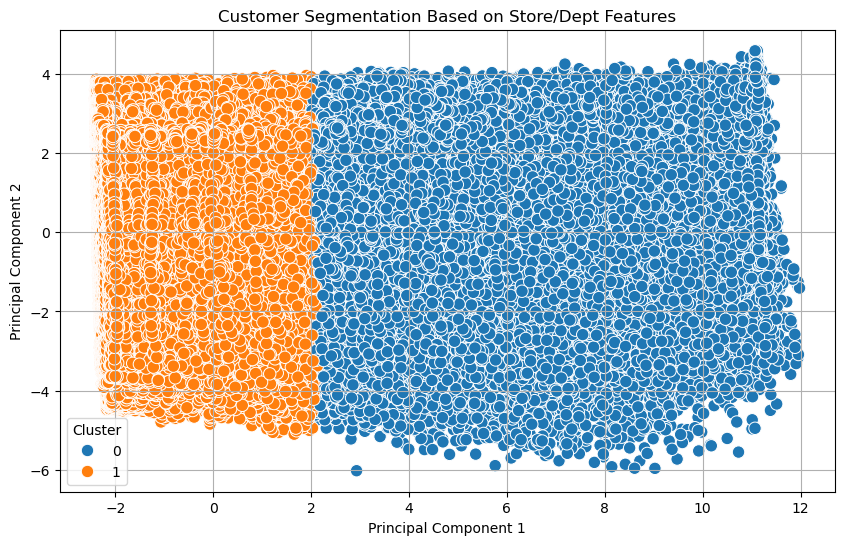

Cluster-wise Feature Averages:
         Size  Temperature  Fuel_Price  MarkDown1  MarkDown2  MarkDown3  \
Cluster                                                                   
0        0.45         0.01        0.02       0.11       0.11       0.08   
1       -0.09        -0.00       -0.00      -0.02      -0.02      -0.02   

         MarkDown4  MarkDown5   CPI  Unemployment  ...  \
Cluster                                            ...   
0             0.10       0.14 -0.02         -0.05  ...   
1            -0.02      -0.03  0.00          0.01  ...   

         Store_Dept_Avg_MarkDown2  Store_Dept_Avg_MarkDown3  \
Cluster                                                       
0                            0.39                      0.35   
1                           -0.08                     -0.07   

         Store_Dept_Avg_MarkDown4  Store_Dept_Avg_MarkDown5  \
Cluster                                                       
0                            0.41                      0

In [144]:
# Visualize clusters with PCA
def plot_pca_clusters(data, labels):
    pca = PCA(n_components=2)
    components = pca.fit_transform(data)
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=labels, palette='tab10', s=80)
    plt.title('Customer Segmentation Based on Store/Dept Features')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.show()

plot_pca_clusters(X_scaled, X_clustered['Cluster'])

# Cluster Summary
cluster_summary = X_clustered.groupby('Cluster').mean().round(2)
print("Cluster-wise Feature Averages:")
print(cluster_summary)

<br>
Customer segmentation involves dividing a customer base into distinct groups that share similar characteristics. This process helps businesses tailor strategies to meet the specific needs of different segments, enhancing customer satisfaction and business performance.<br>
<br>

**Results Summary**
- **Optimal Clusters**: The optimal number of **clusters is determined to be 2, based on silhouette scores**. This indicates two well-defined customer segments.
- **Visualization**: The PCA plot illustrates a clear separation between the two clusters, representing two distinct customer groups with different characteristics.
- **Cluster Characteristics**: Each cluster's feature averages provide insight into its unique properties. This information can be used to develop targeted marketing strategies, product offerings, or customer service approaches tailored to each segment's needs.

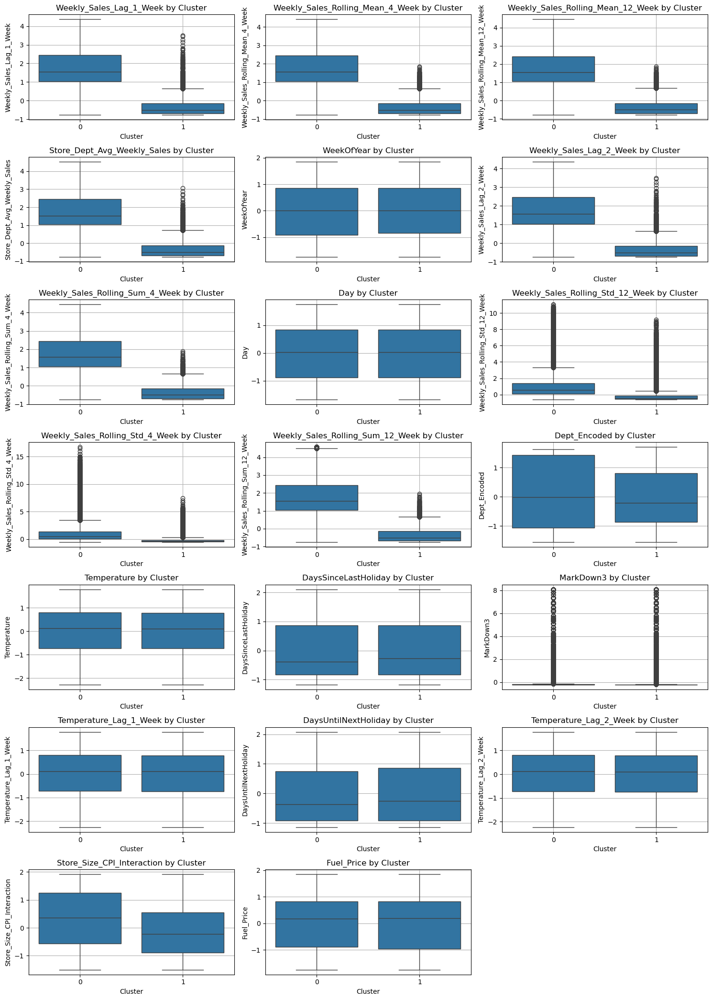

In [149]:
imp_features = [
    'Weekly_Sales_Lag_1_Week', 'Weekly_Sales_Rolling_Mean_4_Week',
    'Weekly_Sales_Rolling_Mean_12_Week', 'Store_Dept_Avg_Weekly_Sales',
    'WeekOfYear', 'Weekly_Sales_Lag_2_Week',
    'Weekly_Sales_Rolling_Sum_4_Week', 'Day',
    'Weekly_Sales_Rolling_Std_12_Week', 'Weekly_Sales_Rolling_Std_4_Week',
    'Weekly_Sales_Rolling_Sum_12_Week', 'Dept_Encoded', 'Temperature',
    'DaysSinceLastHoliday', 'MarkDown3', 'Temperature_Lag_1_Week',
    'DaysUntilNextHoliday', 'Temperature_Lag_2_Week',
    'Store_Size_CPI_Interaction', 'Fuel_Price'
]

# Plot Clusters for each of the 20 features

# Number of plots per row
plots_per_row = 3

# Create subplots grid
n_rows = math.ceil(len(imp_features) / plots_per_row)
fig, axes = plt.subplots(n_rows, plots_per_row, figsize=(15, 3 * n_rows))
axes = axes.flatten()  # flatten to easily index axes

# Loop through features
for i, col in enumerate(imp_features):
    sns.boxplot(x='Cluster', y=col, data=X_clustered, ax=axes[i])
    axes[i].set_title(f'{col} by Cluster')
    axes[i].grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


##### Cluster Analysis

1. **Weekly_Sales_Lag and Rolling Mean**:
   - Cluster 0 consistently has higher values, indicating generally higher sales performance.
   - Cluster 1 shows more lower sales metrics, suggesting weaker sales.

2. **Weekly_Sales_Rolling_Std**:
   - Cluster 0 displays higher variability in sales, indicating less consistency but possibly more potential for high sales.
   - Cluster 1 shows less variability, suggesting more stable but lower sales.

3. **Store and Temperature Factors**:
   - Features like `Store_Size_CPI_Interaction` and temperature-related metrics show minimal variation between clusters.
   - This suggests that these features are not major differentiators between the clusters.

4. **Temporal Features**:
   - Time-related features like `WeekOfYear`, `Day`, and holiday proximity (e.g., `DaysSinceLastHoliday`) do not show significant differences. Hence, these aspects do not majorly influence cluster separation.

5. **Fuel Price and Department Encoding**:
   - These financial and categorical features slightly differ between clusters but aren't key differentiators.

##### Overall Insights

- **Cluster 0** tends to have higher sales performance metrics but with more variability, indicating potential growth.
- **Cluster 1** shows lower sales performance, with more consistent but limited sales activity.

These insights allow for strategic decisions focused on boosting sales in Cluster 1 and leveraging opportunities in Cluster 0.

---

## 11. Personalized Marketing & Inventory Strategy Using Segments and Markdowns

In [151]:
store_segments_df = df.copy()
store_segments_df['Cluster'] = kmeans.fit_predict(X_scaled)

store_segments_df = store_segments_df.reset_index()[['Store', 'Cluster']]

In [152]:
store_segments_df = pd.DataFrame({
    'Store': X.index,
    'Cluster': kmeans.labels_
})

In [153]:
store_segments_df.head(10)

,Store,Cluster
0,0,1
1,1,1
2,2,0
3,3,0
4,4,0
5,5,0
6,6,1
7,7,1
8,8,1
9,9,0


In [154]:
# Cluster 0 has high sales and low CPI
cluster_labels = {
    0: 'High Sales - Low CPI',
    1: 'Low Sales - High CPI',
}
store_segments_df['Segment'] = store_segments_df['Cluster'].map(cluster_labels)
store_segments_df.head(10)

,Store,Cluster,Segment
0,0,1,Low Sales - High CPI
1,1,1,Low Sales - High CPI
2,2,0,High Sales - Low CPI
3,3,0,High Sales - Low CPI
4,4,0,High Sales - Low CPI
5,5,0,High Sales - Low CPI
6,6,1,Low Sales - High CPI
7,7,1,Low Sales - High CPI
8,8,1,Low Sales - High CPI
9,9,0,High Sales - Low CPI


In [155]:
# Merge clusters back with original (unscaled) data
df_with_clusters = df.copy()
df_with_clusters['Cluster'] = kmeans.labels_

# Select only numeric columns for aggregation
numeric_cols = df_with_clusters.select_dtypes(include='number').columns

# Group by cluster and compute mean
cluster_profiles = df_with_clusters[numeric_cols].groupby('Cluster').mean().round(2)

print(cluster_profiles)

         Weekly_Sales       Size  Temperature  Fuel_Price  MarkDown1  \
Cluster                                                                
0            53514.58  163879.83        60.20        3.37    3005.30   
1             8230.10  131404.09        60.09        3.36    2343.04   

         MarkDown2  MarkDown3  MarkDown4  MarkDown5     CPI  ...  \
Cluster                                                      ...   
0           969.05      75.27    1186.31    1912.68  170.22  ...   
1           605.21      51.95     884.17    1447.11  171.39  ...   

         Store_Dept_Avg_MarkDown3  Store_Dept_Avg_MarkDown4  \
Cluster                                                       
0                           68.08                   1151.41   
1                           53.84                    890.87   

         Store_Dept_Avg_MarkDown5  Store_Dept_Avg_Total_MarkDown  \
Cluster                                                            
0                         1806.43                

<br>

#### Analysis

1. **Sales and Inventory**:
   - Cluster 0 exhibits significantly higher `Weekly_Sales` and larger `Size`, indicating more substantial operations and sales volume.
   - Cluster 1 has lower sales and smaller size, suggesting smaller or less active stores.

2. **Markdown Strategy**:
   - Cluster 0 benefits from higher markdowns across various periods and departments, implying aggressive pricing strategies that may drive higher sales.
   - Cluster 1 uses markdowns less intensively, which might correlate with lower sales performance.

3. **Temperature and Fuel Price**:
   - Both clusters show similar temperature and fuel price averages, indicating these factors might not directly influence the distinction between clusters.

4. **Encoded Features**:
   - Variations in features like `Store_Encoded`, `Dept_Encoded`, and `DayOfWeek_Encoded` suggest differences in store types and operations, which could be critical for tailored marketing strategies.

5. **Inventory Insights**:
   - Cluster 0's higher markdowns and sales indicate a strategic move to clear high inventory volumes rapidly.
   - Cluster 1's lower markdowns suggest a more conservative approach to inventory management.

#### Strategic Implications

- **For Cluster 0**: Focus on maximizing marketing efforts and maintaining dynamic markdown strategies to sustain high sales and rapid inventory turnover.
- **For Cluster 1**: Explore increasing markdown activities to stimulate sales and consider targeted marketing campaigns to boost store performance.

---

## 12. Strategy Generation Logic

In [158]:
# Strategy Logic per Cluster
print("=== Cluster Promotion Strategies ===")
overall_sales_mean = df_with_clusters['Weekly_Sales'].mean()

for cluster_id, row in cluster_profiles.iterrows():
    print(f"\nCluster {cluster_id} Strategy:")

    if row['MarkDown1'] > 0 and row['Weekly_Sales'] > overall_sales_mean:
        print("- Responsive to promotions. Use frequent markdowns to drive volume.")

    elif row['MarkDown1'] > 0 and row['Weekly_Sales'] < overall_sales_mean:
        print("- Markdown-heavy but low returns. Reduce discounts and refine targeting.")

    else:
        print("- Low markdown usage. Focus on premium pricing or niche targeting.")

# Inventory Management Suggestions by Cluster & Dept
print("\n\n=== Top 3 Departments per Cluster for Inventory Strategy ===\n")

# Aggregate
inventory_suggestions = (
    df_with_clusters
    .groupby(['Cluster', 'Dept'])[['Weekly_Sales', 'MarkDown1']]
    .mean()
    .round(2)
    .reset_index()
)

# Sort and get top 3 departments per cluster by Weekly_Sales
top_depts_per_cluster = (
    inventory_suggestions
    .sort_values(['Cluster', 'Weekly_Sales'], ascending=[True, False])
    .groupby('Cluster')
    .head(3)
)

# Display top suggestions
print(top_depts_per_cluster)

# Save full strategy table
full_inventory_strategy = (
    df_with_clusters
    .groupby(['Cluster', 'Dept'])
    .agg({'Weekly_Sales': ['mean', 'std'], 'MarkDown1': 'mean'})
    .round(2)
)

=== Cluster Promotion Strategies ===

Cluster 0 Strategy:
- Responsive to promotions. Use frequent markdowns to drive volume.

Cluster 1 Strategy:
- Markdown-heavy but low returns. Reduce discounts and refine targeting.


=== Top 3 Departments per Cluster for Inventory Strategy ===

     Cluster Dept  Weekly_Sales  MarkDown1
73         0   92      77545.56    2404.93
76         0   95      72464.53    2555.19
71         0   90      67612.01    2519.69
138        1   65      41255.02       0.00
157        1   95      25281.16    1006.93
117        1   38      22229.84     315.06


<br>

**Cluster Promotion Strategies**

1. **Cluster 0 Strategy**:
   - Highly responsive to promotions. Frequent markdowns are effective in driving sales volume.
   - Strategy suggests continuing or enhancing the use of markdowns to boost sales, leveraging the existing sensitivity to pricing changes.

2. **Cluster 1 Strategy**:
   - Despite being markdown-heavy, returns remain low.
   - Strategy focuses on reducing discounts and refining targeting efforts to improve sales efficiency and return on investment.

**Inventory Strategy**

**Top 3 Departments per Cluster**

- **Cluster 0**:
  - Departments 92, 95, and 90 show high sales and markdowns, indicating successful clearance and sales activities.
  - Focus on maintaining stock levels and promotional activities in these areas to sustain performance.

- **Cluster 1**:
  - Departments 65, 95, and 38 indicate varying success; consider adjusting inventory and promotional strategies to enhance performance.
  - Key efforts should aim at better targeting and possibly adjusting price strategies to increase returns.

These insights support tailored strategies to optimize promotions and inventory across different cluster characteristics.

---

## 13. Demand Forecasting

- Demand forecasting involves predicting future customer demand for products or services over a specific period. It utilizes historical data, statistical algorithms, and machine learning models to generate accurate predictions.
- Key benefits include inventory management, helping maintain optimal inventory levels and reducing overstock and stockouts. It aids in production planning by aligning schedules with forecasted demand, ensuring resource efficiency. Financial planning is supported by anticipating revenue streams, and marketing strategies are informed by predicting peak demand periods.-
- Effective demand forecasting is crucial for making informed business decisions, reducing costs, and improving customer satisfaction by aligning supply with anticipated demand.

### Forecasting for 2013

#### Data preparation for forecasting

In [194]:
df_by_date = df.groupby('Date', as_index=False).agg({'Temperature': 'mean',
                                                    'Fuel_Price': 'mean',
                                                    'CPI': 'mean',
                                                    'Unemployment': 'mean',
                                                    'Weekly_Sales': 'sum',
                                                    'IsHoliday': 'mean'})

In [195]:
df_by_date.Date = pd.to_datetime(df_by_date.Date, errors='coerce')
df_by_date.set_index('Date', inplace=True)

In [196]:
df_by_date.head()

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-02-05,33.835090,2.718127,167.398405,8.576731,4.811440e+07,0.0
2010-02-12,33.365491,2.701615,167.384138,8.567309,4.743088e+07,1.0
2010-02-19,37.038310,2.693005,167.338966,8.576351,4.739760e+07,0.0
2010-02-26,38.695662,2.687460,167.691019,8.561375,4.324960e+07,0.0
2010-03-05,42.373998,2.731816,167.727351,8.572689,4.592178e+07,0.0


##### Resampling (weekly, backfill) with some dummy dates in the middle as the above data doesn't have a definitive frequency.

In [197]:
df_by_date_new = df_by_date.resample('W').mean().fillna(method='bfill')

In [199]:
df_by_date_new.head(10)

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-02-07,33.835090,2.718127,167.398405,8.576731,4.811440e+07,0.0
2010-02-14,33.365491,2.701615,167.384138,8.567309,4.743088e+07,1.0
2010-02-21,37.038310,2.693005,167.338966,8.576351,4.739760e+07,0.0
2010-02-28,38.695662,2.687460,167.691019,8.561375,4.324960e+07,0.0
2010-03-07,42.373998,2.731816,167.727351,8.572689,4.592178e+07,0.0
2010-03-14,46.967143,2.774452,167.504162,8.580858,4.510352e+07,0.0
2010-03-21,49.481019,2.816063,167.478101,8.571996,4.440697e+07,0.0
2010-03-28,47.979325,2.823610,167.510338,8.575041,4.373191e+07,0.0
2010-04-04,52.587887,2.825453,167.377836,8.441092,4.954906e+07,0.0


#### Seasonal Decomposition

Seasonal Decompose gives the decomposition of the time series into its estimated trend component, estimated seasonal component, and estimated residual. We can also plot the original data to look at what components of the data influence its true value the most.

In [200]:
from statsmodels.tsa.seasonal import seasonal_decompose

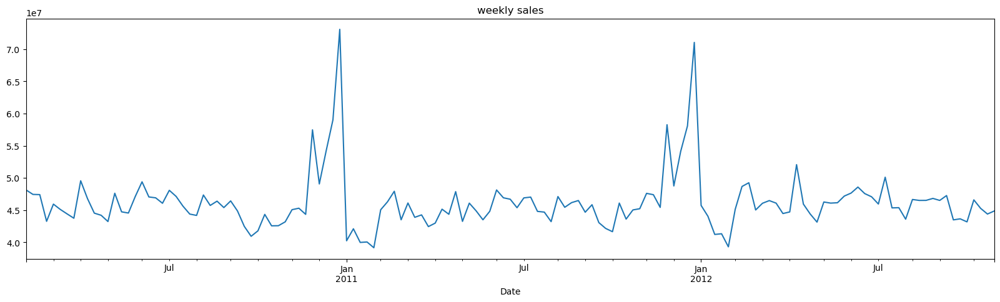

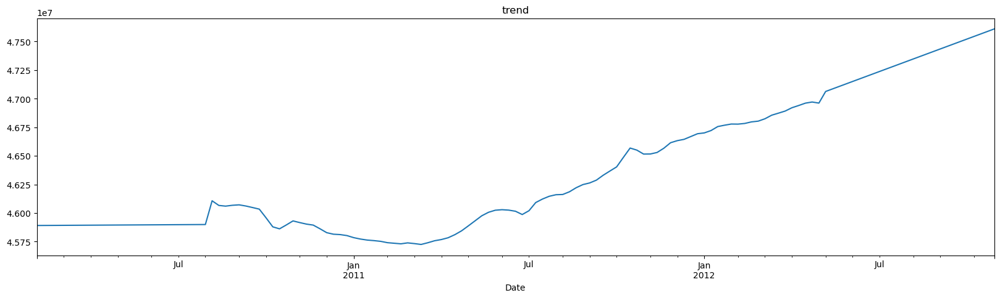

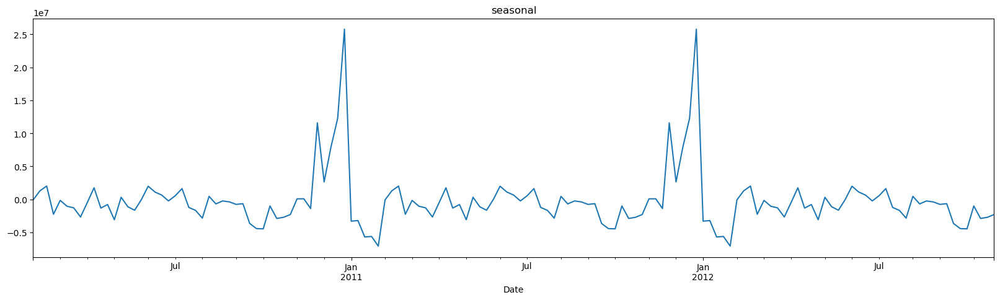

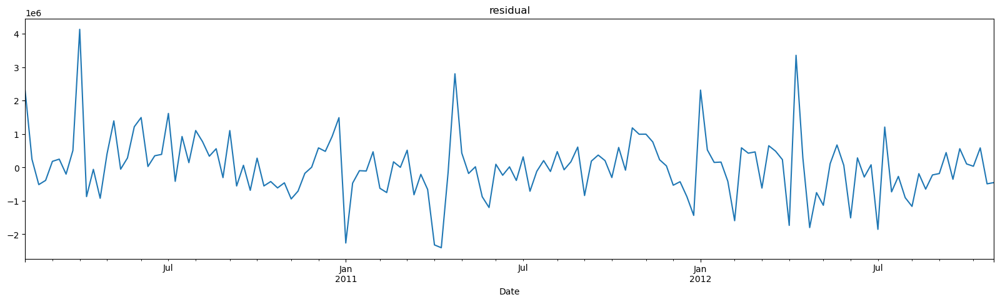

In [201]:
multi_plot = seasonal_decompose(df_by_date_new['Weekly_Sales'], model = 'add', extrapolate_trend='freq')

plt.figure(figsize=(20,5))
multi_plot.observed.plot(title = 'weekly sales')

plt.figure(figsize=(20,5))
multi_plot.trend.plot(title = 'trend')

plt.figure(figsize=(20,5))
multi_plot.seasonal.plot(title = 'seasonal')

plt.figure(figsize=(20,5))
multi_plot.resid.plot(title = 'residual');

**Observation** - The series is strongly influenced by the seasonal component.

#### External Factors Correlation

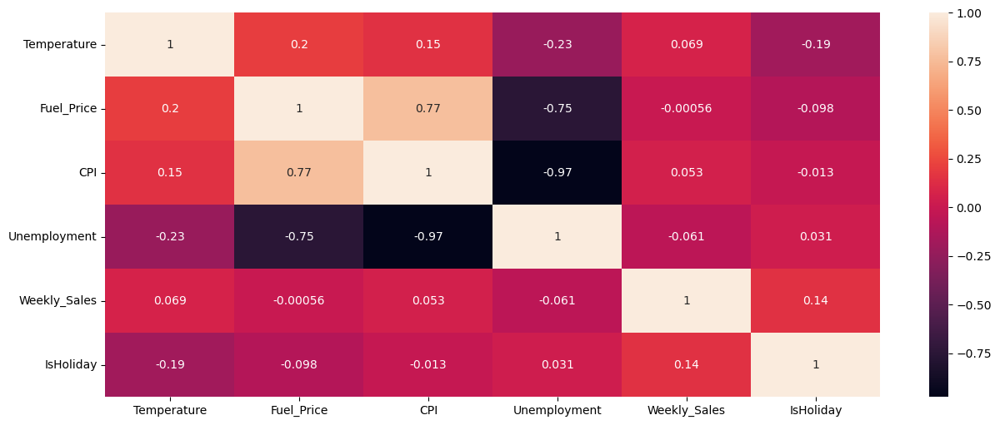

In [202]:
plt.figure(figsize=(15,6))
sns.heatmap(df_by_date_new.corr('spearman'), annot = True);

**Observation** - 
- **Strong positive correlation between Fuel_Price and CPI**
- **Strong negative correlation between Unemployment and Fuel_Price** and **Unemployment and CPI**.
- Surprisingly, unemployment rate doesn't really seem to affect the weekly sales (directly at least).

#### Forecasting using Holt-Winters Exponential Smoothing Method

Exponential smoothing is a technique for smoothening time series data by giving different weights which are exponentially decreasing over time, unlike simple moving average method which assigns equal weightage to all observations. Holt Winters exponential smoothening applies exponential smoothing three times, usually done when high frequency signal has to be removed.

In [209]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:120],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

prediction = fit_model.forecast(23)
prediction

2012-05-27    4.634967e+07
2012-06-03    4.954727e+07
2012-06-10    4.821326e+07
2012-06-17    4.803132e+07
2012-06-24    4.681084e+07
2012-07-01    4.838766e+07
2012-07-08    4.834620e+07
2012-07-15    4.620723e+07
2012-07-22    4.596229e+07
2012-07-29    4.464499e+07
2012-08-05    4.868919e+07
2012-08-12    4.711531e+07
2012-08-19    4.781965e+07
2012-08-26    4.702194e+07
2012-09-02    4.767464e+07
2012-09-09    4.653505e+07
2012-09-16    4.410797e+07
2012-09-23    4.268469e+07
2012-09-30    4.341476e+07
2012-10-07    4.631437e+07
2012-10-14    4.446085e+07
2012-10-21    4.466138e+07
2012-10-28    4.518132e+07
Freq: W-SUN, dtype: float64

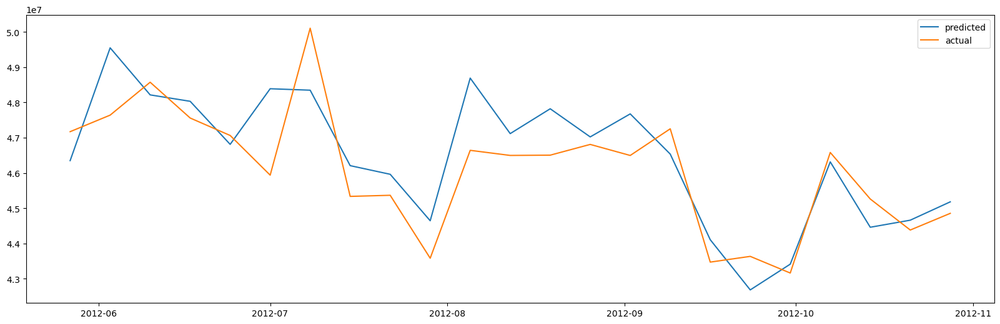

In [210]:
plt.figure(figsize=(20,6))
plt.plot(df_by_date_new.index[120:], prediction, label = 'predicted')
plt.plot(df_by_date_new.index[120:], df_by_date_new.Weekly_Sales[120:], label = 'actual')
plt.legend()

In [211]:
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
print("Mean Absolute Percentage Error = {a}%".format(a=mean_absolute_percentage_error(df_by_date_new.Weekly_Sales[120:],prediction)))

Mean Absolute Percentage Error = 1.8912682825234082%


In [212]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:-2],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

future_prediction = fit_model.forecast(56)
future_prediction

2012-10-21    4.439152e+07
2012-10-28    4.488783e+07
2012-11-04    4.686565e+07
2012-11-11    4.702003e+07
2012-11-18    4.589534e+07
2012-11-25    5.901278e+07
2012-12-02    5.045968e+07
2012-12-09    5.565917e+07
2012-12-16    6.038532e+07
2012-12-23    7.430416e+07
2012-12-30    4.280243e+07
2013-01-06    4.401894e+07
2013-01-13    4.178647e+07
2013-01-20    4.187842e+07
2013-01-27    4.080575e+07
2013-02-03    4.702234e+07
2013-02-10    4.845049e+07
2013-02-17    4.971010e+07
2013-02-24    4.536174e+07
2013-03-03    4.772777e+07
2013-03-10    4.615989e+07
2013-03-17    4.626337e+07
2013-03-24    4.461322e+07
2013-03-31    4.572031e+07
2013-04-07    4.815979e+07
2013-04-14    4.620242e+07
2013-04-21    4.840001e+07
2013-04-28    4.485840e+07
2013-05-05    4.793522e+07
2013-05-12    4.670825e+07
2013-05-19    4.570438e+07
2013-05-26    4.709667e+07
2013-06-02    4.978847e+07
2013-06-09    4.883837e+07
2013-06-16    4.850253e+07
2013-06-23    4.741299e+07
2013-06-30    4.852726e+07
2

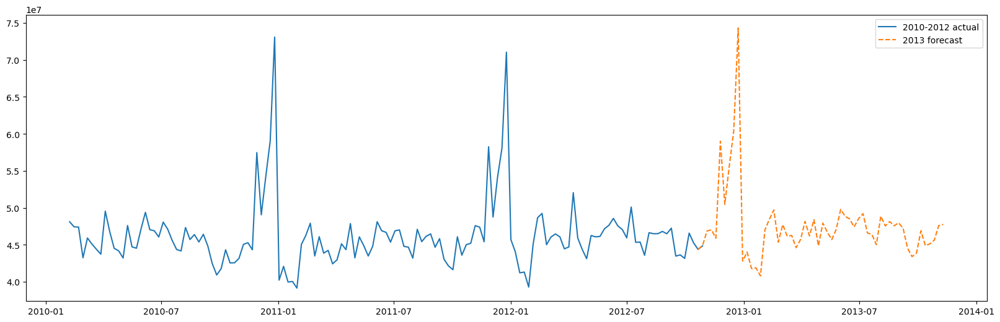

In [214]:
plt.figure(figsize=(20, 6))
plt.plot(df_by_date_new.index, df_by_date_new.Weekly_Sales)
plt.plot(future_prediction, '--')
plt.legend(['2010-2012 actual', '2013 forecast'])

### Explore Short-term and Long-term Forecasting Models

### Short-term forecasting model - SARIMAX

In [168]:
# We'll work with original data for building the forecasting model

# Merge data
merged_data = pd.merge(sales_df, features_df, on=['Store','Date','IsHoliday'], how='left')

# Feature engineering
# Add lagged sales
merged_data['lagged_sales_1'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1)
merged_data['lagged_sales_2'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2)

In [169]:
#Data-Preprocessing

# Convert categorical variables to numerical
merged_data['IsHoliday'] = merged_data['IsHoliday'].apply(lambda x: 1 if x==True else 0)

# Convert dates to datetime objects
merged_data['Date'] = pd.to_datetime(merged_data['Date'], format='%d/%m/%Y')
#merged_data['Date']=pd.to_datetime(merged_data['Date'],freq='W')

# Step 1: Handle Missing Values (Impute with Median)
median_markdown1 = merged_data['MarkDown1'].median()
median_markdown2 = merged_data['MarkDown2'].median()
median_markdown3 = merged_data['MarkDown3'].median()
median_markdown4 = merged_data['MarkDown4'].median()
median_markdown5 = merged_data['MarkDown5'].median()

merged_data['MarkDown1'].fillna(median_markdown1, inplace=True)
merged_data['MarkDown2'].fillna(median_markdown2, inplace=True)
merged_data['MarkDown3'].fillna(median_markdown3, inplace=True)
merged_data['MarkDown4'].fillna(median_markdown4, inplace=True)
merged_data['MarkDown5'].fillna(median_markdown5, inplace=True)

merged_data['lagged_sales_1'].fillna(0, inplace=True)
merged_data['lagged_sales_2'].fillna(0, inplace=True)

In [170]:
merged_data.set_index('Date', inplace=True)

In [171]:
merged_data = merged_data.fillna(0)

In [172]:
# Remove duplicates and keep only the first occurrence of each date
merged_data = merged_data[~merged_data.index.duplicated(keep='first')]

In [173]:
# Aggregate duplicates by summing sales for each week
merged_data = merged_data.groupby(merged_data.index).sum()

In [174]:
# Normalize numerical features
scaler = StandardScaler()
merged_data_scaled=scaler.fit_transform(merged_data)

In [175]:
# Split data into train and test sets
train_data, test_data = train_test_split(merged_data, test_size=0.2, shuffle=False)

In [176]:
test_data.shape

(29, 15)

In [179]:
# Ensure monotonicity
train_data = train_data.sort_index()

# Short-term forecasting with SARIMA
model_sarimax = SARIMAX(train_data['Weekly_Sales'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 52))
sarimax_result = model_sarimax.fit()
sarimax_forecast = sarimax_result.forecast(steps=len(test_data))

In [180]:
# Model evaluation
# SARIMAX
sarimax_mae = mean_absolute_error(test_data['Weekly_Sales'], sarimax_forecast)
sarimax_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], sarimax_forecast))

In [181]:
print("SARIMAX MAE:", sarimax_mae)
print("SARIMAX RMSE:", sarimax_rmse)

SARIMAX MAE: 10768.748852672326
SARIMAX RMSE: 12259.559894223255


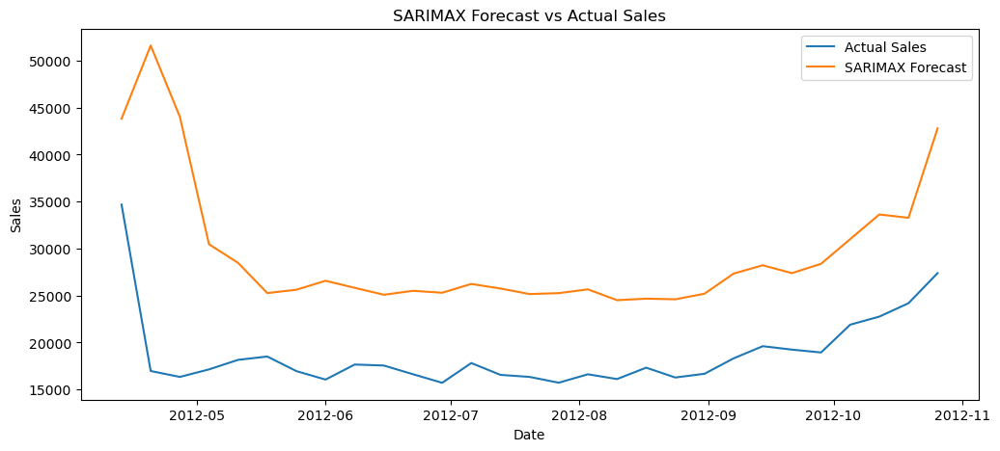

In [183]:
# Visualization
# SARIMAX forecast plot
plt.figure(figsize=(12, 5))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, sarimax_forecast, label='SARIMAX Forecast')
plt.title('SARIMAX Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Long-term forecasting models - RandomForestRegressor

In [184]:
# Long-term forecasting with Random Forest Regression
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']
X_test = test_data.drop(columns=['Weekly_Sales'])


model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
rf_forecast = model_rf.predict(X_test)

In [185]:
# Random Forest
rf_mae = mean_absolute_error(test_data['Weekly_Sales'], rf_forecast)
rf_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], rf_forecast))

In [186]:
print("RF MAE:", rf_mae)
print("RF RMSE:", rf_rmse)

RF MAE: 1676.0722620689671
RF RMSE: 2747.8236996182122


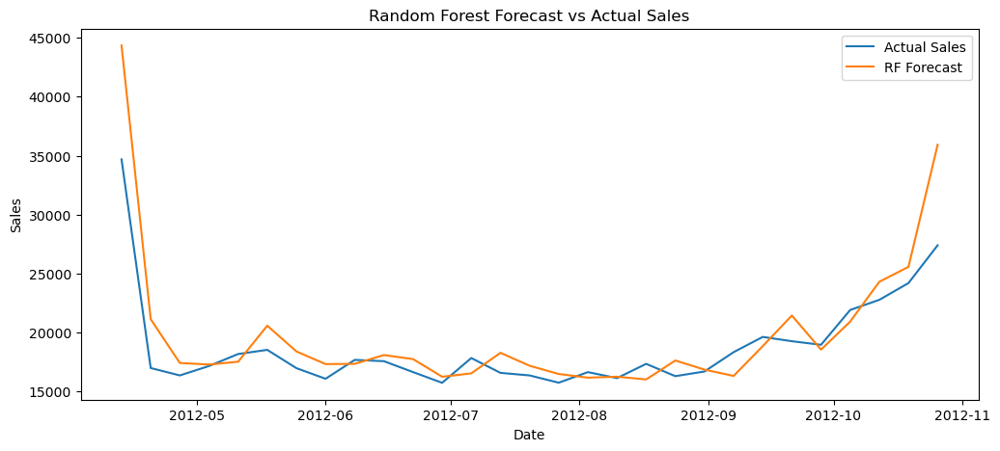

In [187]:
# Random Forest forecast plot
plt.figure(figsize=(12, 5))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, rf_forecast, label='RF Forecast')
plt.title('Random Forest Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

In [188]:
rf_forecast=pd.Series(rf_forecast)

In [189]:
test_data = test_data['Weekly_Sales'].reset_index(drop=True)
sarimax_forecast = sarimax_forecast.reset_index(drop=True)

### Error Distribution in Short term vs. Long term Forecasting Model

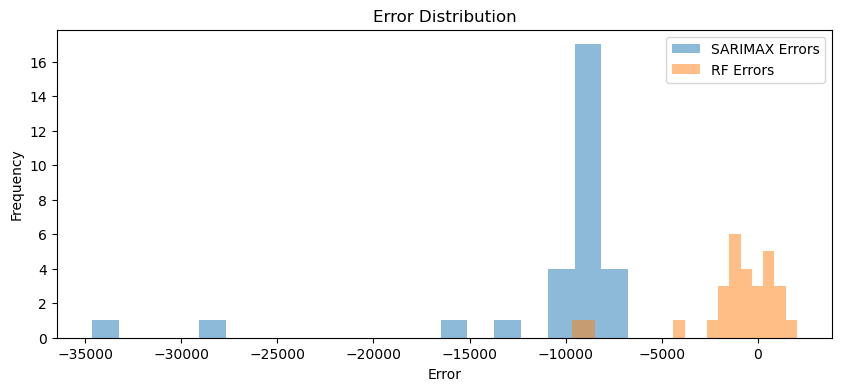

In [192]:
# Error distribution plot
sarimax_errors = test_data - sarimax_forecast
rf_errors = test_data - rf_forecast

plt.figure(figsize=(10, 4))
plt.hist(sarimax_errors, bins=20, alpha=0.5, label='SARIMAX Errors')
plt.hist(rf_errors, bins=20, alpha=0.5, label='RF Errors')
plt.title('Error Distribution')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()

---

## 14. Impact of External Factors

#### Influence of external factors (economic indicators, regional climate) on sales

Feature Importance: [0.         0.         0.00279373 0.05513052 0.0194306  0.00414304
 0.00682435 0.00147571 0.00706298 0.01068885 0.01938085 0.01748217
 0.6231008  0.23248641]
Impact of External Factors on Demand:
         Feature  Importance
0          Store    0.000000
1           Dept    0.000000
7      MarkDown3    0.001476
2      IsHoliday    0.002794
5      MarkDown1    0.004143
6      MarkDown2    0.006824
8      MarkDown4    0.007063
9      MarkDown5    0.010689
11  Unemployment    0.017482
10           CPI    0.019381
4     Fuel_Price    0.019431
3    Temperature    0.055131


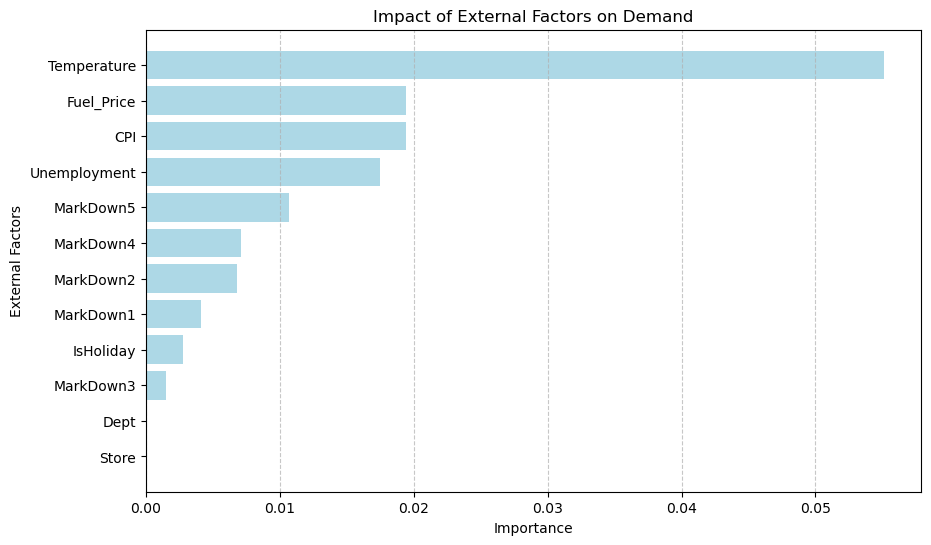

In [222]:
# Feature importance of the model
importances = model_rf.feature_importances_
print("Feature Importance:", importances)

# Impact analysis of external factors
impact = pd.DataFrame({'Feature': X_train.columns[:12], 'Importance': importances[:12]})
impact = impact.sort_values(by='Importance', ascending = True)
print("Impact of External Factors on Demand:")
print(impact)

# Visualization
plt.figure(figsize=(10, 6))
plt.barh(impact['Feature'], impact['Importance'], color='lightblue')  # Using barh for horizontal bar plot
plt.title('Impact of External Factors on Demand')
plt.xlabel('Importance')
plt.ylabel('External Factors')
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Setting grid to x-axis
plt.show()

##### **Findings:**

Incorporating external factors such as economic indicators and regional climate into demand forecasting models is crucial for accurate predictions. Let's delve into the findings and see how these factors influence sales:

**Temperature**:

- Regional climate directly affects consumer behavior and demand for certain products. For example, in colder regions, there might be a higher demand for winter clothing, heating equipment, and comfort foods during colder months.
- On the other hand, in warmer regions, there might be increased demand for summer clothing, outdoor equipment, and cooling beverages.
- Hence, incorporating temperature data into demand forecasting models can help businesses anticipate seasonal fluctuations in sales and adjust their inventory and marketing strategies accordingly.

**Consumer Price Index (CPI)**:

- The CPI reflects changes in the prices of a basket of goods and services purchased by households. It provides insights into inflationary trends and purchasing power, which directly influence consumer spending patterns.
- When the CPI rises, consumers may become more cautious with their spending and prioritize essential items over discretionary purchases. Conversely, during periods of low inflation, consumers may be more willing to spend on non-essential items.
- Hence, by incorporating CPI data into demand forecasting models, businesses can anticipate changes in consumer behavior and adjust their pricing strategies accordingly.

**Fuel Price**:

- Fluctuations in fuel prices impact various aspects of the economy, including transportation costs, production costs, and consumer purchasing power. Higher fuel prices can lead to increased transportation costs, which may result in higher prices for goods and services.
- This, in turn, can affect consumer spending patterns, as individuals may allocate more of their budget to fuel expenses and cut back on discretionary purchases.
- Hence, by incorporating fuel price data into demand forecasting models, businesses can anticipate the impact of fuel price changes on consumer behavior and adjust their pricing and distribution strategies accordingly.


Based on these findings, it is evident that external factors such as temperature, consumer price index, and fuel price play significant roles in influencing sales and demand forecasting. Therefore, businesses should incorporate these insights into their demand forecasting models to improve the accuracy of their predictions and make more informed decisions regarding inventory management, pricing strategies, and marketing efforts.

#### Incorporating Insights into Demand Forecasting Models

In [223]:
merged_data['CPI_Percent_Change'] = merged_data['CPI'].pct_change()
merged_data['Temp_Percent_Change'] = merged_data['Temperature'].pct_change()
merged_data['Fuel_Price_Percent_Change'] = merged_data['Fuel_Price'].pct_change()

In [224]:
merged_data.fillna(0,inplace=True)

In [226]:
merged_data.columns

Index(['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'lagged_sales_1', 'lagged_sales_2',
       'CPI_Percent_Change', 'Temp_Percent_Change',
       'Fuel_Price_Percent_Change'],
      dtype='object')

In [227]:
df_v1 = merged_data[~merged_data['CPI_Percent_Change'].isin([np.inf, -np.inf])]

In [228]:
# Split data into train and test sets
train_data, test_data = train_test_split(df_v1, test_size=0.2, shuffle=False)

In [229]:
train_data.columns

Index(['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'lagged_sales_1', 'lagged_sales_2',
       'CPI_Percent_Change', 'Temp_Percent_Change',
       'Fuel_Price_Percent_Change'],
      dtype='object')

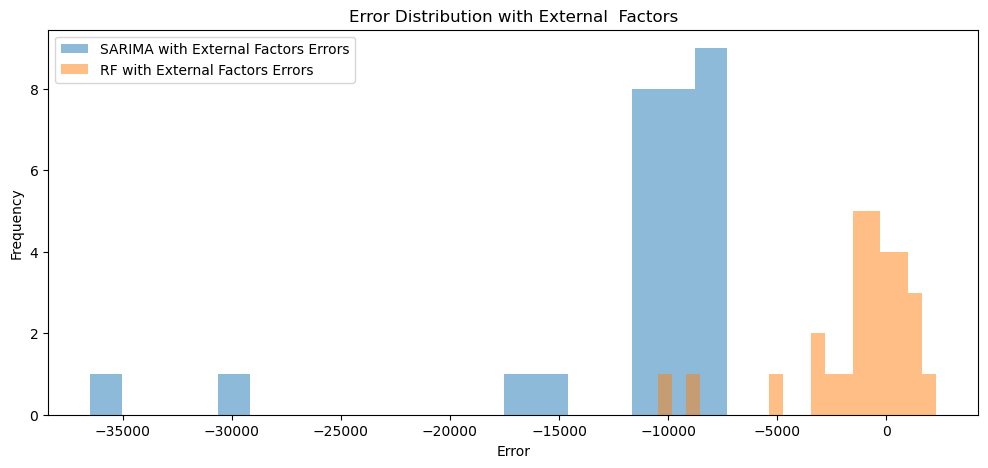

In [230]:
model_sarima_with_ext = SARIMAX(train_data['Weekly_Sales'], exog=train_data[['Temp_Percent_Change','CPI_Percent_Change','Fuel_Price_Percent_Change']], order=(1, 1, 1), seasonal_order=(1, 1, 1, 52))
sarima_ext_result = model_sarima_with_ext.fit()
sarima_ext_forecast = sarima_ext_result.forecast(steps=len(test_data), exog=test_data[['Temp_Percent_Change','CPI_Percent_Change','Fuel_Price_Percent_Change']])

# Long-term forecasting with Random Forest Regression
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']
X_test = test_data[['Store', 'Dept','IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'lagged_sales_1', 'lagged_sales_2',
       'CPI_Percent_Change', 'Temp_Percent_Change',
       'Fuel_Price_Percent_Change']]


model_rf_with_ext = RandomForestRegressor()
model_rf_with_ext.fit(X_train, y_train)
rf_ext_forecast = model_rf_with_ext.predict(X_test)

# Evaluation and Visualization (Similar to previous code)
# Error distribution plot
rf_ext_forecast=pd.Series(rf_ext_forecast)
test_data=test_data['Weekly_Sales'].reset_index(drop=True)
sarima_ext_forecast=sarima_ext_forecast.reset_index(drop=True)
sarima_ext_errors = test_data- sarima_ext_forecast
rf_ext_errors = test_data - rf_ext_forecast

plt.figure(figsize=(12, 5))
plt.hist(sarima_ext_errors, bins=20, alpha=0.5, label='SARIMA with External Factors Errors')
plt.hist(rf_ext_errors, bins=20, alpha=0.5, label='RF with External Factors Errors')
plt.title('Error Distribution with External  Factors')
plt.xlabel('Error')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [231]:
# Random Forest
rf_mae_ext = mean_absolute_error(test_data, rf_ext_forecast)
rf_rmse_ext = np.sqrt(mean_squared_error(test_data, rf_ext_forecast))

In [232]:
print("RF MAE:", rf_mae_ext)
print("RF RMSE:", rf_rmse_ext)

RF MAE: 1822.2958137931032
RF RMSE: 3021.999579495868


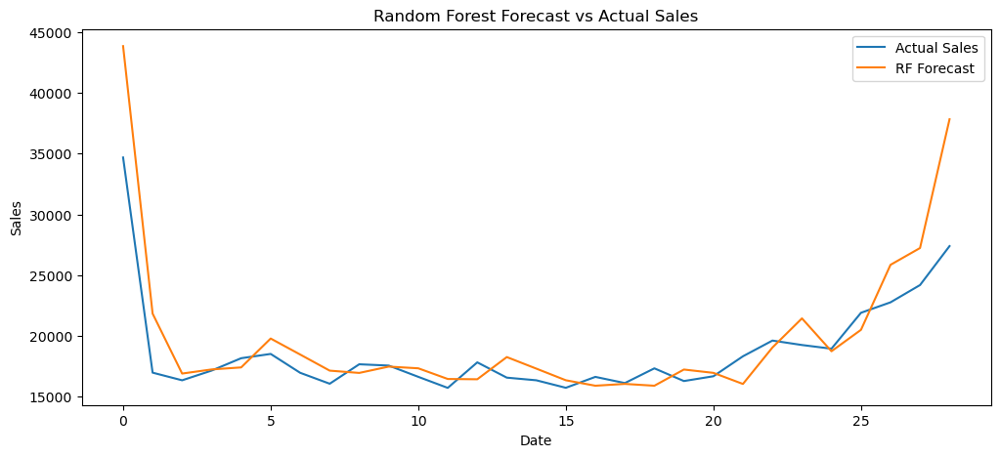

In [234]:
# Random Forest forecast plot
plt.figure(figsize=(12, 5))
plt.plot(test_data.index, test_data, label='Actual Sales')
plt.plot(test_data.index, rf_ext_forecast, label='RF Forecast')
plt.title('Random Forest Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

---

## 15. Real-World Application and Strategy Formulation

Based on the findings regarding the influence of external factors on sales and demand forecasting, here's a comprehensive strategy for inventory management, marketing, and store optimization:

### **Inventory Management**

**Seasonal Forecasting:** 
Utilize temperature data to forecast seasonal demand fluctuations. Allocate inventory space and resources accordingly to meet the anticipated demand for seasonal products.

**Dynamic Pricing:**
Incorporate CPI data to adjust pricing strategies in response to changes in consumer purchasing power. Offer promotions or discounts during periods of low inflation to stimulate sales.

**Supply Chain Optimization:**
Monitor fuel price fluctuations to anticipate changes in transportation costs. Optimize supply chain routes and distribution networks to minimize the impact of fuel price changes on logistics expenses.

### **Marketing Strategies**

**Targeted Campaigns:**
Tailor marketing campaigns based on regional climate conditions to promote relevant products. For example, launch winter clothing promotions in colder regions and summer gear promotions in warmer areas.

**Price Sensitivity Analysis:**
Analyze consumer response to price changes using CPI data. Adjust pricing strategies to maximize revenue while remaining competitive in the market.

**Promotional Timing:**
Coordinate marketing efforts with fluctuations in fuel prices. Launch promotions or special offers during periods of low fuel prices to offset potential decreases in consumer discretionary spending.

### **Store Optimization**

**Product Placement:** 
Arrange store layouts to reflect seasonal demand patterns identified through temperature data. Highlight relevant products prominently to attract customer attention.

**Inventory Turnover:**
Use CPI data to optimize inventory levels and minimize carrying costs. Adjust stock levels based on changes in consumer spending patterns to ensure optimal turnover rates.

**Customer Experience:** 
Leverage insights from fuel price data to offer convenience-oriented services, such as online ordering with flexible delivery options, to mitigate the impact of increased transportation costs on consumers.

### **Challenges in implementing these strategies may include**

**Data Integration:**
Ensuring seamless integration of diverse data sources (temperature, CPI, fuel prices) into existing systems for accurate forecasting and decision-making.

**Resource Allocation:**
Allocating resources effectively to implement dynamic pricing strategies and targeted marketing campaigns based on real-time data analysis.

**Operational Flexibility:** 
Adapting supply chain and inventory management processes to respond quickly to changes in external factors, such as sudden fluctuations in fuel prices or unexpected shifts in consumer behavior.

**Competitive Pressures:** 
Navigating competitive pressures and market dynamics while adjusting pricing strategies to maintain profitability and market share.

Addressing these challenges requires a combination of technological capabilities, strategic planning, and organizational agility to leverage the insights gained from external factors effectively.